Part 1 - Data Processing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

In [2]:
# supress warnings - for a cleaner output
import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv('/Users/tauny/Desktop/Schulich - School/Classes/Fall 2024 - Semester 2/Data Science II/Assignments/Ass 2/Customer_Data.csv')

In [4]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


Outliers: In this instance, 0's as minimums values, although distant from the mean, it normal because often people havecredit cards but do not use them, reulsting in no balances, no payments, no purchases, etc.
The max values on their own seem significntly higher than the 75th percentile for the variables: BALANCE,PURCHASES, ONEOFF_PURCHASES, INSTALLMENTS PURCHASES, CASH_ADVANCE, ONEOFF_PURCHASES_FREQUENCY, CASH_ADVANCE_FREQUENCY, CASHADVANCE_TRX, PURCHASEES_TRX, PAYMENTS, MINIMUM_PAYMENTS, PRC_FULL_PAYMENT. So, we will look further into the number of instances above various thresholds for the columns to determine outlier significance.

In [5]:
# Filter for Balances above $15,000
high_balance_rows = df[df['BALANCE']>15000]
print(high_balance_rows)
print(f"Number of rows with balance greater than 15,000: {len(high_balance_rows)}")

     CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
138   C10144  19043.13856                1.0   22009.92           9449.07   
520   C10544  15258.22590                1.0     529.30            529.30   
585   C10609  15244.74865                1.0    7823.74           7564.81   
2361  C12434  15532.33972                1.0    1168.75              0.00   
4140  C14256  18495.55855                1.0    5288.28           3657.30   
4708  C14836  15155.53286                1.0     717.24            717.24   
5281  C15429  16115.59640                1.0     684.74            105.30   
5488  C15642  16304.88925                1.0    1770.57              0.00   
6629  C16812  16259.44857                1.0    5024.68           3582.45   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
138                 12560.85      0.000000             1.000000   
520                     0.00   4100.891579             0.500000   
585                   258.93

There are 9 values with balances above $15,000. We try 18,000 to ensure still a few samples exist.

In [6]:
# Filter for Balances above $15,000
high_balance_rows_2 = df[df['BALANCE']>18000]
print(high_balance_rows_2)
print(f"Number of rows with balance greater than 18,000: {len(high_balance_rows_2)}")

     CUST_ID      BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
138   C10144  19043.13856                1.0   22009.92           9449.07   
4140  C14256  18495.55855                1.0    5288.28           3657.30   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
138                 12560.85           0.0                  1.0   
4140                 1630.98           0.0                  1.0   

      ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  \
138                     0.750000                               1.0   
4140                    0.583333                               1.0   

      CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT  \
138                      0.0                 0            216       18000.0   
4140                     0.0                 0             76       22000.0   

          PAYMENTS  MINIMUM_PAYMENTS  PRC_FULL_PAYMENT  TENURE  
138   23018.575830       18621.01331               0

The rows above the 75th percentile appear to be valid points in the data and account for some of the other max amounts in the detail as well.

In [7]:
# Filter for MIN_PAYMENTS above $60,000 since max is above $75,000
high_min_pay_rows = df[df['MINIMUM_PAYMENTS']>60000]
print(high_min_pay_rows)
print(f"Number of rows with minimum payments than 60,000: {len(high_min_pay_rows)}")

     CUST_ID       BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
4376  C14499  10571.411070                1.0    7739.48               0.0   
7132  C17325   9024.812044                1.0       0.00               0.0   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
4376                 7739.48      0.000000                  1.0   
7132                    0.00   2750.442399                  0.0   

      ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  \
4376                         0.0                               1.0   
7132                         0.0                               0.0   

      CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  PURCHASES_TRX  CREDIT_LIMIT  \
4376                0.000000                 0             44        8000.0   
7132                0.083333                 2              0        9000.0   

         PAYMENTS  MINIMUM_PAYMENTS  PRC_FULL_PAYMENT  TENURE  
4376  2688.447014       76406.20752               

In [8]:
# Display the specific row with index 4376
row_4376= df.loc[4376]
print(row_4376)

CUST_ID                                  C14499
BALANCE                             10571.41107
BALANCE_FREQUENCY                           1.0
PURCHASES                               7739.48
ONEOFF_PURCHASES                            0.0
INSTALLMENTS_PURCHASES                  7739.48
CASH_ADVANCE                                0.0
PURCHASES_FREQUENCY                         1.0
ONEOFF_PURCHASES_FREQUENCY                  0.0
PURCHASES_INSTALLMENTS_FREQUENCY            1.0
CASH_ADVANCE_FREQUENCY                      0.0
CASH_ADVANCE_TRX                              0
PURCHASES_TRX                                44
CREDIT_LIMIT                             8000.0
PAYMENTS                            2688.447014
MINIMUM_PAYMENTS                    76406.20752
PRC_FULL_PAYMENT                            0.0
TENURE                                       12
Name: 4376, dtype: object


In [9]:
# Display the specific row with index 7132
row_7132 = df.loc[7132]
print(row_7132)

CUST_ID                                  C17325
BALANCE                             9024.812044
BALANCE_FREQUENCY                           1.0
PURCHASES                                   0.0
ONEOFF_PURCHASES                            0.0
INSTALLMENTS_PURCHASES                      0.0
CASH_ADVANCE                        2750.442399
PURCHASES_FREQUENCY                         0.0
ONEOFF_PURCHASES_FREQUENCY                  0.0
PURCHASES_INSTALLMENTS_FREQUENCY            0.0
CASH_ADVANCE_FREQUENCY                 0.083333
CASH_ADVANCE_TRX                              2
PURCHASES_TRX                                 0
CREDIT_LIMIT                             9000.0
PAYMENTS                             302.484224
MINIMUM_PAYMENTS                     61031.6186
PRC_FULL_PAYMENT                            0.0
TENURE                                       12
Name: 7132, dtype: object


Row #s 4376 & 7131 has unusual numbers. Balance is significantly less than the minimum payments, which are generally a small percentage of the balance. This could also be due to penalties, but given the credit limit and balance being slightly over it, such a small amount would not amass such fees.
To improve model performance, We will drop these two data points because it appears to be entry error and will distort the models.

In [10]:
# Sort the DataFrame by 'MINIMUM_PAYMENTS' in descending order and get the top 5 rows
top_5_min_payments = df.sort_values(by='MINIMUM_PAYMENTS', ascending=False).head(10)

# Display the top 5 rows with the highest minimum payments
print(top_5_min_payments)

     CUST_ID       BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
4376  C14499  10571.411070                1.0    7739.48              0.00   
7132  C17325   9024.812044                1.0       0.00              0.00   
5657  C15815   4628.109931                1.0     912.54              0.00   
4462  C14586   4976.028578                1.0     900.87              0.00   
5830  C15993   8038.893195                1.0       0.00              0.00   
5968  C16134   6022.224462                1.0       0.00              0.00   
567   C10591   3457.086184                1.0    2448.60              0.00   
5298  C15448   5044.179003                1.0     966.60              0.00   
1130  C11170   6090.522273                1.0      22.16             22.16   
6635  C16818   4972.108843                1.0    2072.57             45.65   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
4376                 7739.48      0.000000             1.000000   
7132   

All amounts seem for minimum payments extraordinarily high. We check visually the relationship between minimum_payments and balance.

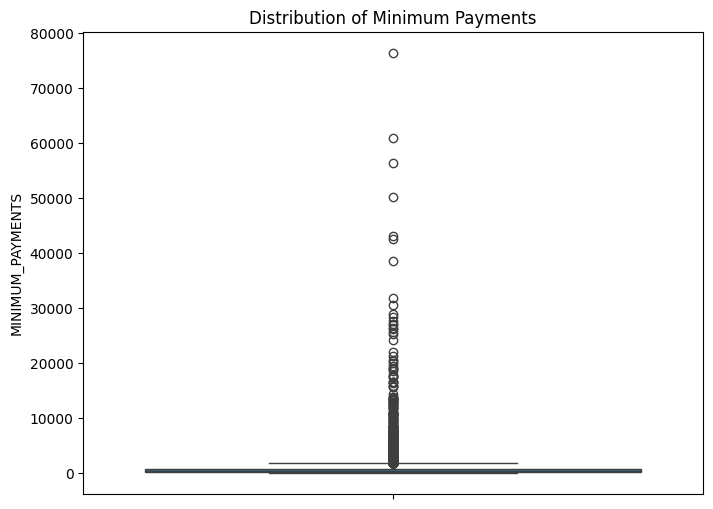

In [11]:
# Box plot to visualize the distribution of MINIMUM_PAYMENTS
plt.figure(figsize=(8,6))
sns.boxplot(y=df['MINIMUM_PAYMENTS'])
plt.title('Distribution of Minimum Payments')
plt.show()

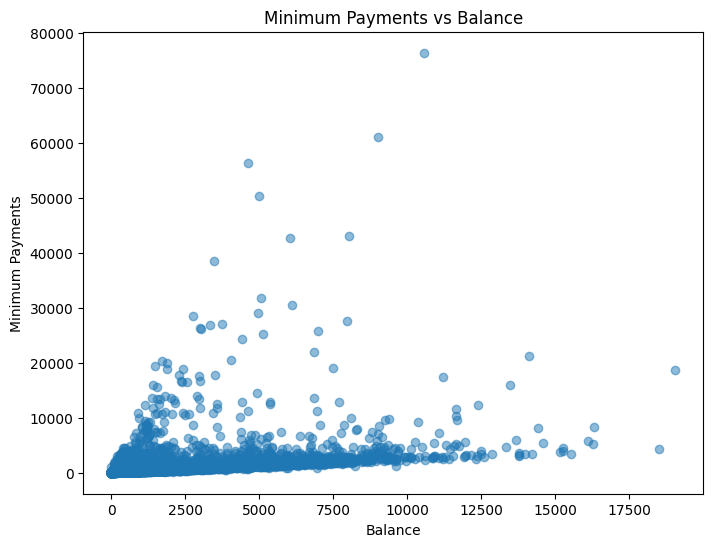

In [12]:
# Scatter plot of MINIMUM_PAYMENTS vs BALANCE
plt.figure(figsize=(8,6))
plt.scatter(df['BALANCE'], df['MINIMUM_PAYMENTS'], alpha=0.5)
plt.title('Minimum Payments vs Balance')
plt.xlabel('Balance')
plt.ylabel('Minimum Payments')
plt.show()

Everythign above $20,000 does not apprear to relate the same to balance.

In [13]:
high_min_pay_rows = df[df['MINIMUM_PAYMENTS']>20000]
print(f"Number of rows with minimum payments greater than 20,000: {len(high_min_pay_rows)}")

Number of rows with minimum payments greater than 20,000: 23


Sinnce there are few rows and for simplicity, we will drop the rows above $20,000. This will also help avoid bias and preserve the integrity of the data

In [14]:
# Drop rows with minimum payments over 20,000 and display how many totl were dropped.
df = df[df['MINIMUM_PAYMENTS']< 20000]

In [15]:
# Check
high_min_pay_rows = df[df['MINIMUM_PAYMENTS']>20000]
print(f"Number of rows with minimum payments greater than 20,000: {len(high_min_pay_rows)}")

Number of rows with minimum payments greater than 20,000: 0


In [16]:
# Looking at the data
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8614 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8614 non-null   object 
 1   BALANCE                           8614 non-null   float64
 2   BALANCE_FREQUENCY                 8614 non-null   float64
 3   PURCHASES                         8614 non-null   float64
 4   ONEOFF_PURCHASES                  8614 non-null   float64
 5   INSTALLMENTS_PURCHASES            8614 non-null   float64
 6   CASH_ADVANCE                      8614 non-null   float64
 7   PURCHASES_FREQUENCY               8614 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8614 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8614 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8614 non-null   float64
 11  CASH_ADVANCE_TRX                  8614 non-null   int64  
 12  PURCHASES_T

8614 entries remaining
18 columns

Empty values contained in features variables # 13 CREDIT_LIMIT (1 value) & 15 MINIMUM_PAYMENTS (313 values).
#13, although insignificant in size, some clustering models, like K-means, can fail or give incorrect reults if values are missing. #15 has a material amount of nulls, which could significalty alter the outcome. So, we will address these null variables.

#13 represents the credit limit assigned to the users credit card. Since only one variable is affected this could be comfortably estimated with the mean

Since the mean could result in a credit limit that is lower than the balance, this may cause an outlier or cause confusion in the outcomes. Since some models are senstive to outliers, it would be better to fill the unknow credit limit value with an amount relevant to balance. Median is used for balance groups to ensure point falls in the middle of the points and is not sensitive to extreme outliers.

In [17]:
# Ensure the 'CREDIT_LIMIT' column is in float type
df['CREDIT_LIMIT'] = df['CREDIT_LIMIT'].astype(float)

In [18]:
# Replace cREDIT_LIMIT value with corresponding BALANCE variable.
# Create balance groups
df['Balance_Group'] = pd.cut(df['BALANCE'], bins=5, labels=["Low", "Below_Average", "Average", "Above_Average", "High"])

# Calculate the median credit limit for each balance group
credit_limit_by_balance_group = df.groupby('Balance_Group')['CREDIT_LIMIT'].median()

# Impute missing credit limit based on the corresponding balance group
df.loc[df['CREDIT_LIMIT'].isnull(), 'CREDIT_LIMIT'] = df.loc[df['CREDIT_LIMIT'].isnull(), 'Balance_Group'].map(credit_limit_by_balance_group).astype(float)

In [19]:
# check
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8614 entries, 0 to 8949
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   CUST_ID                           8614 non-null   object  
 1   BALANCE                           8614 non-null   float64 
 2   BALANCE_FREQUENCY                 8614 non-null   float64 
 3   PURCHASES                         8614 non-null   float64 
 4   ONEOFF_PURCHASES                  8614 non-null   float64 
 5   INSTALLMENTS_PURCHASES            8614 non-null   float64 
 6   CASH_ADVANCE                      8614 non-null   float64 
 7   PURCHASES_FREQUENCY               8614 non-null   float64 
 8   ONEOFF_PURCHASES_FREQUENCY        8614 non-null   float64 
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8614 non-null   float64 
 10  CASH_ADVANCE_FREQUENCY            8614 non-null   float64 
 11  CASH_ADVANCE_TRX                  8614 non-null   int64   
 1

For #15 minimum payments, this replacment null values should also should also be relevant to the balance data, but this time not related to median but directly to the balance, as a percentage of total balance, since minimum payments are generally tied to a portion of the balance. First we find the percentage of minimum payments as it related to the corresponding balance for each instance in the data. Then we use the median overall percentage against the balance to impute the null minimum payments values.

In [20]:
# Calculate the percentage of minimum payments relative to balance for non-null values
df['Payment_Percentage'] = df['MINIMUM_PAYMENTS'] / df['BALANCE']

# Calculate the median percentage of payments relative to balance
median_payment_percentage = df['Payment_Percentage'].median()

# Impute missing values in 'MINIMUM_PAYMENTS' using the median payment percentage and the corresponding balance
df.loc[df['MINIMUM_PAYMENTS'].isnull(), 'MINIMUM_PAYMENTS'] = (
    df.loc[df['MINIMUM_PAYMENTS'].isnull(), 'BALANCE'] * median_payment_percentage
)

In [21]:
# Check
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8614 entries, 0 to 8949
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   CUST_ID                           8614 non-null   object  
 1   BALANCE                           8614 non-null   float64 
 2   BALANCE_FREQUENCY                 8614 non-null   float64 
 3   PURCHASES                         8614 non-null   float64 
 4   ONEOFF_PURCHASES                  8614 non-null   float64 
 5   INSTALLMENTS_PURCHASES            8614 non-null   float64 
 6   CASH_ADVANCE                      8614 non-null   float64 
 7   PURCHASES_FREQUENCY               8614 non-null   float64 
 8   ONEOFF_PURCHASES_FREQUENCY        8614 non-null   float64 
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8614 non-null   float64 
 10  CASH_ADVANCE_FREQUENCY            8614 non-null   float64 
 11  CASH_ADVANCE_TRX                  8614 non-null   int64   
 1

In [22]:
# Checking for number unknowns in data.
df.isin(['unknown']).sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
Balance_Group                       0
Payment_Percentage                  0
dtype: int64

There are zero unknow values in the data. 
So, we will not address this any further.

In [23]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Balance_Group,Payment_Percentage
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12,Low,3.410935
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12,Low,0.334848
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12,Low,0.251402
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12,Low,0.299360
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12,Low,1.330096


There are no categorical variables to be converted so there is no need to encode the data

In [24]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Payment_Percentage
count,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000
mean,1590.237894,0.894681,1024.649812,605.876294,419.085409,991.173937,0.495810,0.206210,0.368452,0.137691,3.312050,15.004063,4518.449980,1782.875303,775.749535,0.159710,11.532737,inf
std,2082.837567,0.208042,2167.608764,1685.957562,913.461920,2109.653018,0.401139,0.300182,0.397873,0.201806,6.908814,25.138046,3659.198824,2905.234875,1468.813370,0.296539,1.313783,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000,0.070737
25%,147.100477,0.909091,44.137500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.805943,168.977016,0.000000,12.000000,0.291698
50%,912.894704,1.000000,375.115000,45.550000,94.485000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,897.282710,310.399040,0.000000,12.000000,0.458172
75%,2083.003308,1.000000,1145.475000,600.000000,480.617500,1131.940818,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1947.827567,814.311270,0.166667,12.000000,1.337489
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,19977.005720,1.000000,12.000000,inf


Data still contains numbers high numbers to be investigated further.

Explore hte data ____ BRING DOWN OUTLIERS STUFF. CLEANING GOES UP TOP.

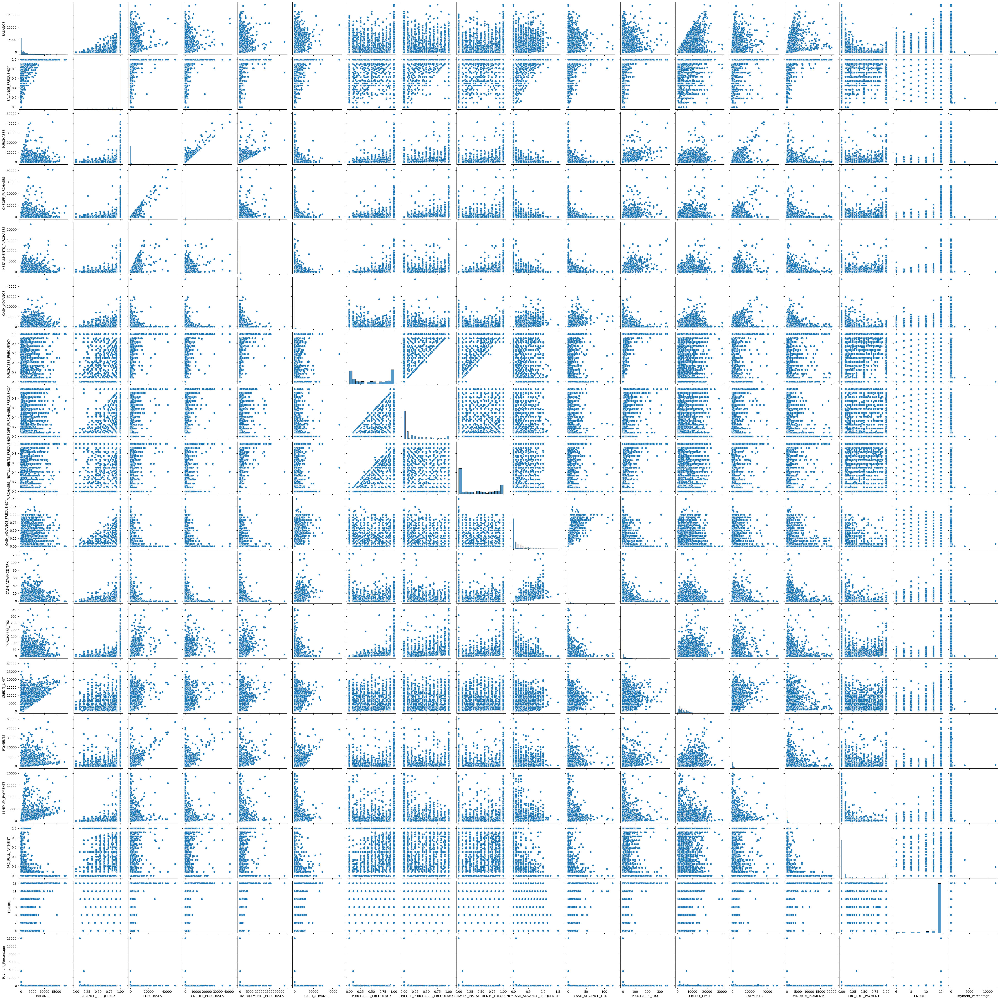

In [25]:
# Pair plot for all numerical features in the dataset
sns.pairplot(df)
plt.show()

Many of these distributions are heaavily skewed and do not have  normal, bell-shaped distribution. This suggests k-means may not perform optimally because centroids will be pulled toward the skwed data point.

Outliers still appear present: Balance vs Purchase

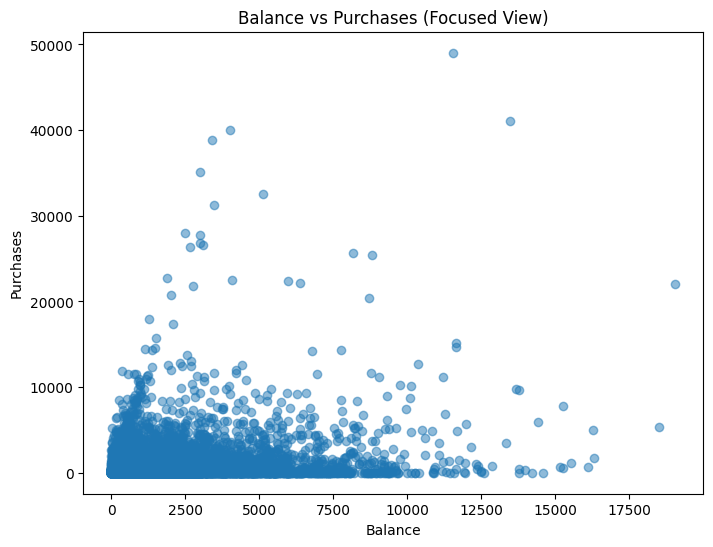

In [26]:
# Focused scatter plot on specific features, such as BALANCE vs PURCHASES
plt.figure(figsize=(8, 6))
plt.scatter(df['BALANCE'], df['PURCHASES'], alpha=0.5)
plt.title('Balance vs Purchases (Focused View)')
plt.xlabel('Balance')
plt.ylabel('Purchases')
plt.show()

These outliers appera to make sense - Large balances would amass in many or few purchases, even near 0 purchases could have a large balance. 0 rated purchases should not have a significant balance unlesss cash advances do not count as transaction. Lets further look to determine if 0 purchases amount have blances in other fields like cash_advance to see if these are entry errors, or contain a balance unraealted to purchases.

In [27]:
# Filter rows where PURCHASES are 0
zero_purchases = df[df['PURCHASES'] == 0]

# Check rows where BALANCE is high but CASH_ADVANCE is 0 (potential issues)
suspicious_rows = zero_purchases[(zero_purchases['BALANCE'] > 1000) & (zero_purchases['CASH_ADVANCE'] == 0)]

# Display suspicious rows
print(suspicious_rows[['CUST_ID', 'BALANCE', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']])

Empty DataFrame
Columns: [CUST_ID, BALANCE, CASH_ADVANCE, CREDIT_LIMIT, PAYMENTS]
Index: []


There are no rows where purchases are 0, the balance is greater than 1,000 (chosen for fees and other charges associated with membership), and cash advanes are 0. These means all rows where purchases are zero and balances are high, are explained by other fields (ex. cash advance). 
This means amount of purchases is not inclues of all transactions. Therefore the exhibited 'outlier' data points are meaningful to the analysis. So we will leave these rows as are.

We looke closer at Payments and Purchases to identify outliers.

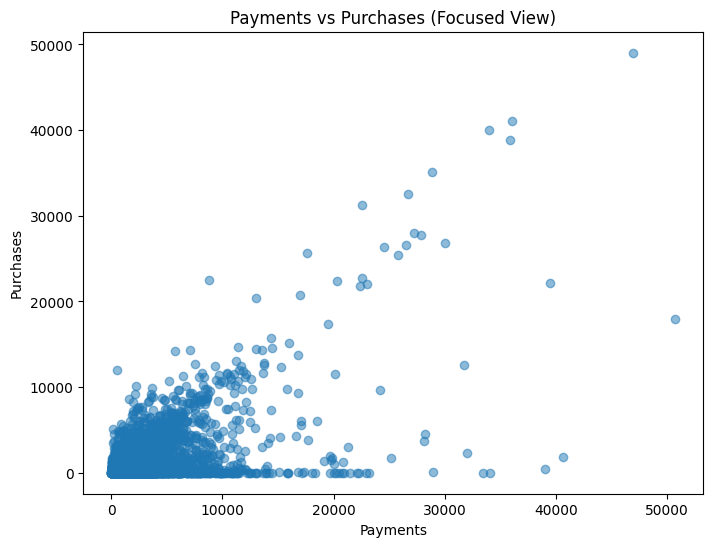

In [28]:
# Focused scatter plot on specific features, such as PAYMENTS vs PURCHASES
plt.figure(figsize=(8, 6))
plt.scatter(df['PAYMENTS'], df['PURCHASES'], alpha=0.5)
plt.title('Payments vs Purchases (Focused View)')
plt.xlabel('Payments')
plt.ylabel('Purchases')
plt.show()

In [29]:
# Filter rows where PURCHASES are 0
zero_purchases = df[df['PURCHASES'] == 0]

# Check rows where BALANCE is high but CASH_ADVANCE is 0 (potential issues)
suspicious_rows = zero_purchases[(zero_purchases['PAYMENTS'] > 1000) & (zero_purchases['CASH_ADVANCE'] == 0)]

# Display suspicious rows
print(suspicious_rows[['CUST_ID', 'BALANCE', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']])

Empty DataFrame
Columns: [CUST_ID, BALANCE, CASH_ADVANCE, CREDIT_LIMIT, PAYMENTS]
Index: []


In [30]:
#TEST to see if above code is accurately pulling data by removing one threshold.
suspicious_rows = zero_purchases[zero_purchases['CASH_ADVANCE'] == 0]
print(suspicious_rows[['CUST_ID', 'BALANCE', 'CASH_ADVANCE', 'CREDIT_LIMIT', 'PAYMENTS']])

     CUST_ID     BALANCE  CASH_ADVANCE  CREDIT_LIMIT    PAYMENTS
2221  C12291  391.385478           0.0        4000.0  192.787345


In [31]:
print(zero_purchases[['CUST_ID', 'BALANCE', 'CASH_ADVANCE', 'PAYMENTS']].describe())

            BALANCE  CASH_ADVANCE      PAYMENTS
count   1961.000000   1961.000000   1961.000000
mean    2193.549948   2006.028886   1712.297015
std     2109.079381   2501.489332   2750.719583
min        0.001146      0.000000      0.049513
25%      825.207867    379.770302    395.136073
50%     1497.145968   1218.392345    803.519921
75%     2861.137399   2705.839993   1777.003806
max    14581.459140  26194.049540  34107.074990


In [32]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Payment_Percentage
count,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000,8614.000000
mean,1590.237894,0.894681,1024.649812,605.876294,419.085409,991.173937,0.495810,0.206210,0.368452,0.137691,3.312050,15.004063,4518.449980,1782.875303,775.749535,0.159710,11.532737,inf
std,2082.837567,0.208042,2167.608764,1685.957562,913.461920,2109.653018,0.401139,0.300182,0.397873,0.201806,6.908814,25.138046,3659.198824,2905.234875,1468.813370,0.296539,1.313783,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000,0.070737
25%,147.100477,0.909091,44.137500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.805943,168.977016,0.000000,12.000000,0.291698
50%,912.894704,1.000000,375.115000,45.550000,94.485000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,897.282710,310.399040,0.000000,12.000000,0.458172
75%,2083.003308,1.000000,1145.475000,600.000000,480.617500,1131.940818,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1947.827567,814.311270,0.166667,12.000000,1.337489
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,19977.005720,1.000000,12.000000,inf


All other numbers appear ok with the data, ex. the max total cash advances corresponds with the max credit limit.

Cash_advancea and purchases both affect payments and balance. Lets try PCA in these columns andsee any effects.

Pca 

In [33]:
from sklearn.decomposition import PCA

We combine Purchases and Cash Advance into column since together they better present a whole amount. These transactions can invididually be compared with cash advance trx and purchaestrx.

In [34]:
# Create a new feature 'Total_Transactions' that combines Purchases and Cash_Advance
df['Total_Transactions'] = df['PURCHASES'] + df['CASH_ADVANCE']

# Display the first few rows to check the new feature
print(df[['PURCHASES', 'CASH_ADVANCE', 'Total_Transactions']].head())

   PURCHASES  CASH_ADVANCE  Total_Transactions
0      95.40      0.000000           95.400000
1       0.00   6442.945483         6442.945483
2     773.17      0.000000          773.170000
4      16.00      0.000000           16.000000
5    1333.28      0.000000         1333.280000


In [35]:
#PAYMENTS BALANCE TOTAL_TRANSACTIONS

In [36]:
# We try PCA on factors with identified relationship.

In [37]:
# To identify drop columns from PCA.
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8614 entries, 0 to 8949
Data columns (total 21 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   CUST_ID                           8614 non-null   object  
 1   BALANCE                           8614 non-null   float64 
 2   BALANCE_FREQUENCY                 8614 non-null   float64 
 3   PURCHASES                         8614 non-null   float64 
 4   ONEOFF_PURCHASES                  8614 non-null   float64 
 5   INSTALLMENTS_PURCHASES            8614 non-null   float64 
 6   CASH_ADVANCE                      8614 non-null   float64 
 7   PURCHASES_FREQUENCY               8614 non-null   float64 
 8   ONEOFF_PURCHASES_FREQUENCY        8614 non-null   float64 
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8614 non-null   float64 
 10  CASH_ADVANCE_FREQUENCY            8614 non-null   float64 
 11  CASH_ADVANCE_TRX                  8614 non-null   int64   
 1

To drop. Cust #, PAyment_percentage, balance_group, Cash_advnace, purchases.

We scale the data because there are significant differences in the variable sizes between the columns. Some clustering algorithms are sensitive to this magnatude of features, especially K-Means which is a common clustering model for customer segmentation. We use MinMaxScaler because it has a smaller distance at 0-1, this is good for distance based models like K-Means. We also do not have any negative values. Scaling will reduce the impact of the statistical outliers and help prevent bias towards certain features, ex high payments.

In [38]:
# Drop specified columns and scale the data
scaled_df = pd.DataFrame(MinMaxScaler().fit_transform(df.drop(columns=['PURCHASES', 'CASH_ADVANCE', 'CUST_ID', 'Payment_Percentage', 'Balance_Group'])),
                         columns=df.drop(columns=['PURCHASES', 'CASH_ADVANCE', 'CUST_ID', 'Payment_Percentage', 'Balance_Group']).columns)

# Apply PCA and reduce to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_df)

# Create a new DataFrame with the PCA results
pca_df = pd.DataFrame(pca_components, columns=['PC1', 'PC2'])

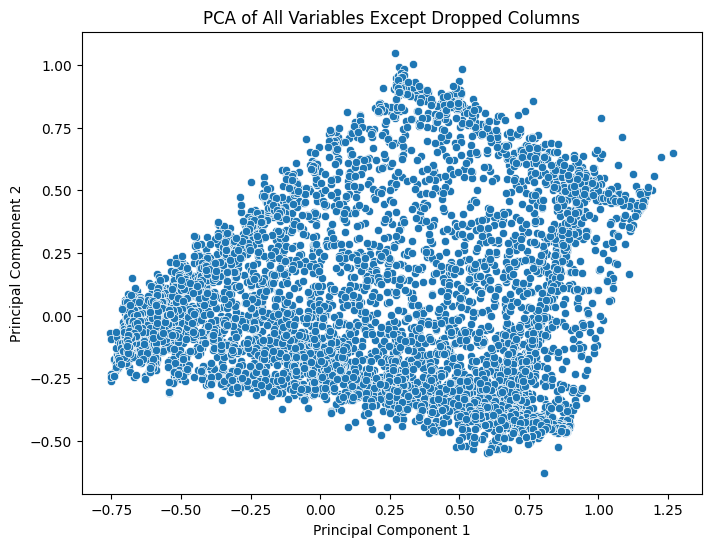

In [39]:
# Visualize the two principal components
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('PCA of All Variables Except Dropped Columns')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

This does not show any obviou clusters, but there is a concentration around the middle of the plot suggesting many of the points arw simialar in these two components. It doesn't appear to have significant outliers, suggesting that outliers have been sufficiently removed ..

In [40]:
# Check explained variance
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance by PC1: {explained_variance[0]:.2f}")
print(f"Explained variance by PC2: {explained_variance[1]:.2f}")
print(f"Total explained variance by PC1 and PC2: {explained_variance.sum():.2f}")

Explained variance by PC1: 0.50
Explained variance by PC2: 0.14
Total explained variance by PC1 and PC2: 0.64


We don't feel 64% percent captures enough of the variance in the model. Lets try adding another component.

In [41]:
# Apply PCA and reduce to 2 components
pca = PCA(n_components=3)
pca_components = pca.fit_transform(scaled_df)

# Create a new DataFrame with the PCA results
pca_df = pd.DataFrame(pca_components, columns=['PC1', 'PC2', 'PC3'])

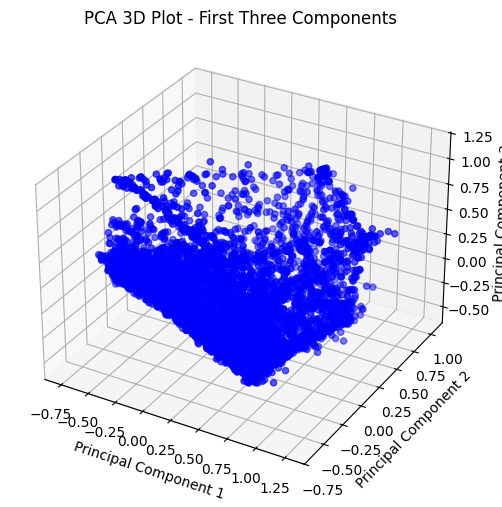

In [42]:
# Create a 3D plot of the three components
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot the 3 components
ax.scatter(pca_components[:, 0], pca_components[:, 1], pca_components[:, 2], c='b', marker='o')

# Add labels and title
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.title('PCA 3D Plot - First Three Components')

plt.show()

In [43]:
# Check explained variance
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance by PC1: {explained_variance[0]:.2f}")
print(f"Explained variance by PC2: {explained_variance[1]:.2f}")
print(f"Total explained variance by PC1 and PC2: {explained_variance.sum():.2f}")

Explained variance by PC1: 0.50
Explained variance by PC2: 0.14
Total explained variance by PC1 and PC2: 0.77


In [44]:
# Assuming your PCA model is stored in the variable `pca`
loadings = pca.components_

# Create a DataFrame to make it easier to interpret
# The rows are the principal components, and the columns are the original features
loadings_df = pd.DataFrame(loadings, columns=df.drop(columns=['PURCHASES', 'CASH_ADVANCE', 'CUST_ID', 'Payment_Percentage', 'Balance_Group']).columns)

# Display the loadings for each component
print(loadings_df)

    BALANCE  BALANCE_FREQUENCY  ONEOFF_PURCHASES  INSTALLMENTS_PURCHASES  \
0 -0.018372           0.083212          0.020285                0.035571   
1  0.079251           0.152770          0.061554               -0.002605   
2 -0.165216          -0.333661          0.007479               -0.005940   

   PURCHASES_FREQUENCY  ONEOFF_PURCHASES_FREQUENCY  \
0             0.685319                    0.244686   
1             0.087403                    0.853323   
2            -0.070555                    0.071422   

   PURCHASES_INSTALLMENTS_FREQUENCY  CASH_ADVANCE_FREQUENCY  CASH_ADVANCE_TRX  \
0                          0.638314               -0.077754         -0.021400   
1                         -0.436096                0.036854          0.013539   
2                         -0.195498               -0.120239         -0.038994   

   PURCHASES_TRX  CREDIT_LIMIT  PAYMENTS  MINIMUM_PAYMENTS  PRC_FULL_PAYMENT  \
0       0.075494      0.030136  0.013504         -0.001216          0.198

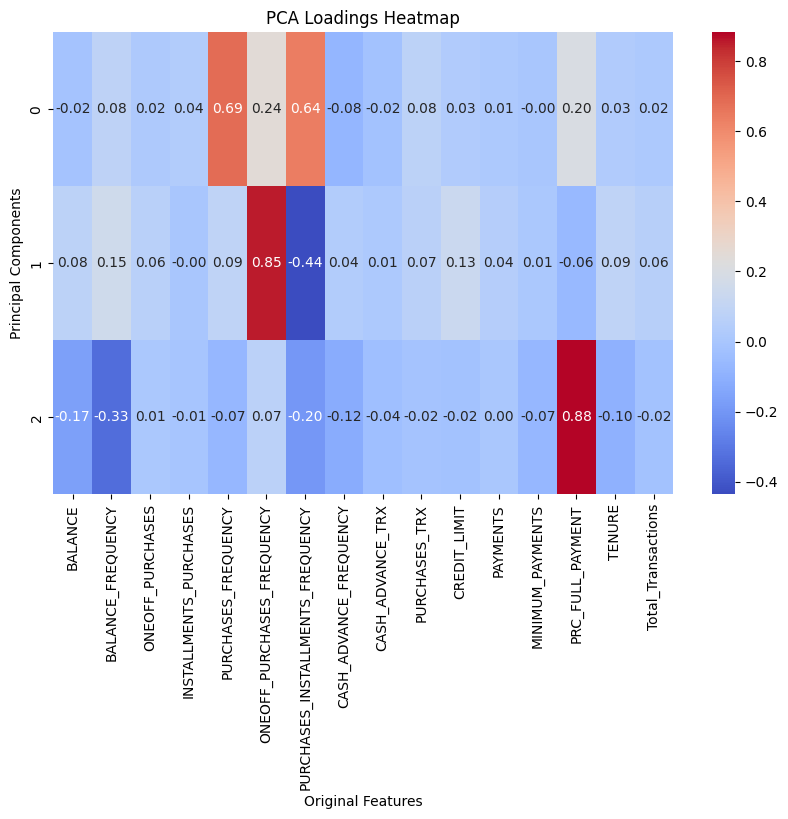

In [45]:
# Heat map of PCA loadings
plt.figure(figsize=(10, 6))

# Plot a heatmap of the loadings
sns.heatmap(loadings_df, annot=True, cmap='coolwarm', fmt='.2f')

# Add titles and labels
plt.title('PCA Loadings Heatmap')
plt.xlabel('Original Features')
plt.ylabel('Principal Components')

plt.show()

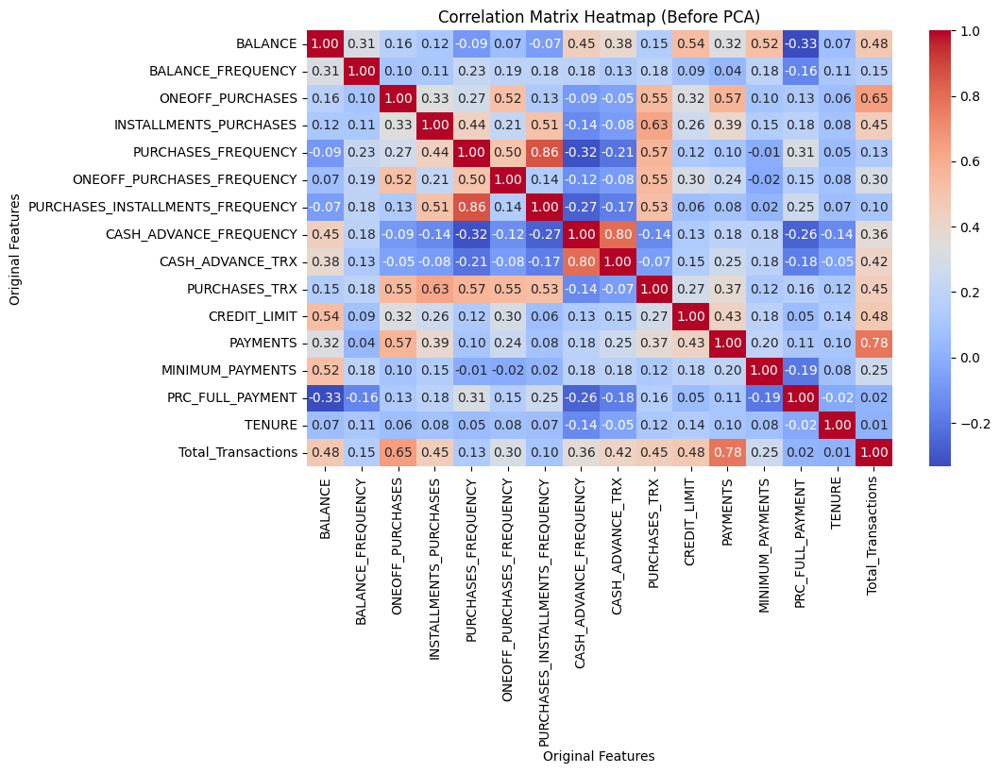

In [46]:
# Compare with original heatmap before PCA
# Plot the heatmap for the correlation matrix
# Compute the correlation matrix for the numeric features only
corr_matrix = scaled_df.corr()

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')

# Add titles and labels
plt.title('Correlation Matrix Heatmap (Before PCA)')
plt.xlabel('Original Features')
plt.ylabel('Original Features')

plt.show()

Without PCA shows clear relationships, and tthere does not appear to be a need to fr the PCA. this will also prevent us from losing any meaningful realtionships unidentified by the PCA.

In [47]:
# Display the correlation matrix numerically
print(corr_matrix)

                                   BALANCE  BALANCE_FREQUENCY  \
BALANCE                           1.000000           0.310125   
BALANCE_FREQUENCY                 0.310125           1.000000   
ONEOFF_PURCHASES                  0.161572           0.095691   
INSTALLMENTS_PURCHASES            0.117571           0.114749   
PURCHASES_FREQUENCY              -0.089788           0.228825   
ONEOFF_PURCHASES_FREQUENCY        0.065172           0.188378   
PURCHASES_INSTALLMENTS_FREQUENCY -0.071080           0.184445   
CASH_ADVANCE_FREQUENCY            0.447497           0.181488   
CASH_ADVANCE_TRX                  0.382525           0.133575   
PURCHASES_TRX                     0.147501           0.183264   
CREDIT_LIMIT                      0.535241           0.087492   
PAYMENTS                          0.321544           0.039357   
MINIMUM_PAYMENTS                  0.520351           0.184723   
PRC_FULL_PAYMENT                 -0.333344          -0.156041   
TENURE                   

In [48]:
# Identify strong relationships by filtering pairs of features with correlation values above 0.3 or below -0.3
strong_correlations = corr_matrix[(corr_matrix > 0.3) | (corr_matrix < -0.3)]
print(strong_correlations)

                                   BALANCE  BALANCE_FREQUENCY  \
BALANCE                           1.000000           0.310125   
BALANCE_FREQUENCY                 0.310125           1.000000   
ONEOFF_PURCHASES                       NaN                NaN   
INSTALLMENTS_PURCHASES                 NaN                NaN   
PURCHASES_FREQUENCY                    NaN                NaN   
ONEOFF_PURCHASES_FREQUENCY             NaN                NaN   
PURCHASES_INSTALLMENTS_FREQUENCY       NaN                NaN   
CASH_ADVANCE_FREQUENCY            0.447497                NaN   
CASH_ADVANCE_TRX                  0.382525                NaN   
PURCHASES_TRX                          NaN                NaN   
CREDIT_LIMIT                      0.535241                NaN   
PAYMENTS                          0.321544                NaN   
MINIMUM_PAYMENTS                  0.520351                NaN   
PRC_FULL_PAYMENT                 -0.333344                NaN   
TENURE                   

In [49]:
scaled_df.head()

,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Total_Transactions
0,0.002148,0.818182,0.000000,0.004240,0.166667,0.000000,0.083333,0.000000,0.00000,0.005587,0.031720,0.003978,0.006983,0.000000,1.0,0.001923
1,0.168169,0.909091,0.000000,0.000000,0.000000,0.000000,0.000000,0.166667,0.03252,0.000000,0.232053,0.080892,0.053678,0.222222,1.0,0.129904
2,0.131026,1.000000,0.018968,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.033520,0.248748,0.012263,0.031399,0.000000,1.0,0.015589
3,0.042940,1.000000,0.000393,0.000000,0.083333,0.083333,0.000000,0.000000,0.00000,0.002793,0.038397,0.013373,0.012253,0.000000,1.0,0.000323
4,0.095038,1.000000,0.000000,0.059257,0.666667,0.000000,0.583333,0.000000,0.00000,0.022346,0.058431,0.027602,0.120500,0.000000,1.0,0.026882


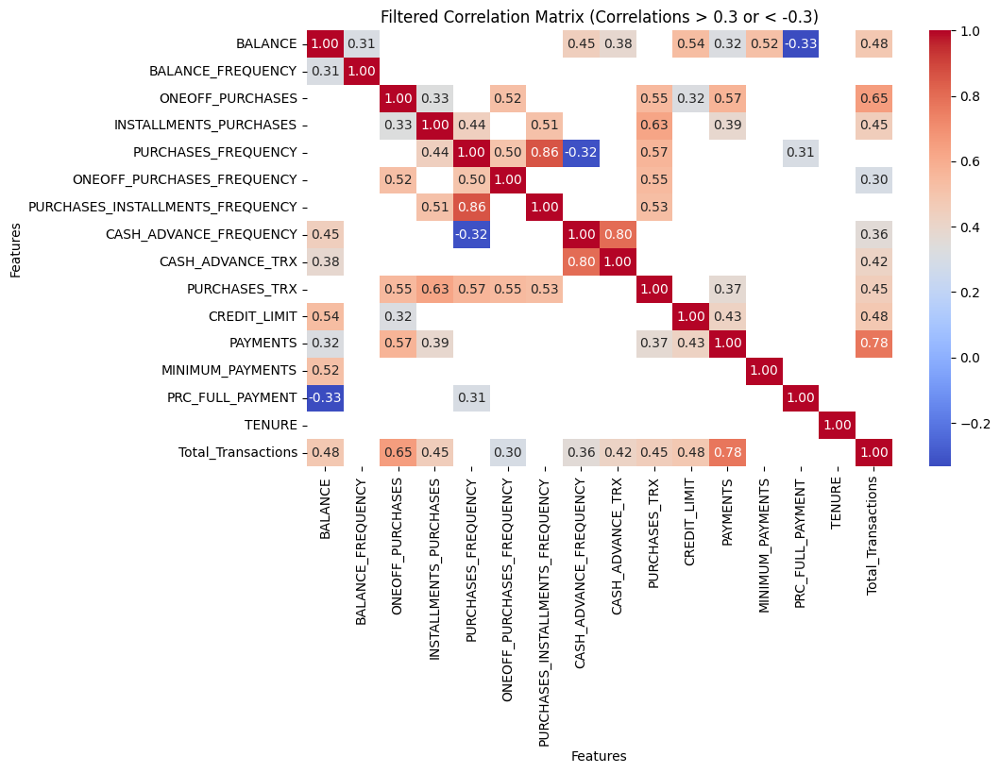

In [50]:
# Define the correlation threshold
corr_threshold = 0.3

# Filter the correlation matrix to include only values > 0.3 or < -0.3
strong_correlations = corr_matrix[(corr_matrix > corr_threshold) | (corr_matrix < -corr_threshold)]

# Drop rows and columns where all values are NaN (features with no strong correlations)
filtered_corr_matrix = strong_correlations.dropna(how='all', axis=0).dropna(how='all', axis=1)

# Visualize the filtered correlation matrix using a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(filtered_corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')

# Add titles and labels
plt.title('Filtered Correlation Matrix (Correlations > 0.3 or < -0.3)')
plt.xlabel('Features')
plt.ylabel('Features')
plt.show()

Tenure does not seem to hold any value towards reltaionship. But since tenure likely plays a role in long-term customer behaviour, we will keep it. ###TRY TO CHECK  SILHOUETTE CORE LATER WITHOUT TENURE _ IF SCORE INCREASES DROP TENURE FOR NOT ADDING VALUE
We proceed with all feautres for clustering models.

We look at specifc relationships to explore spending patterns. Its important to understand the clustering to ensure model results reflect real patterns in the data.

Segment Customers Based on Spending Patterns

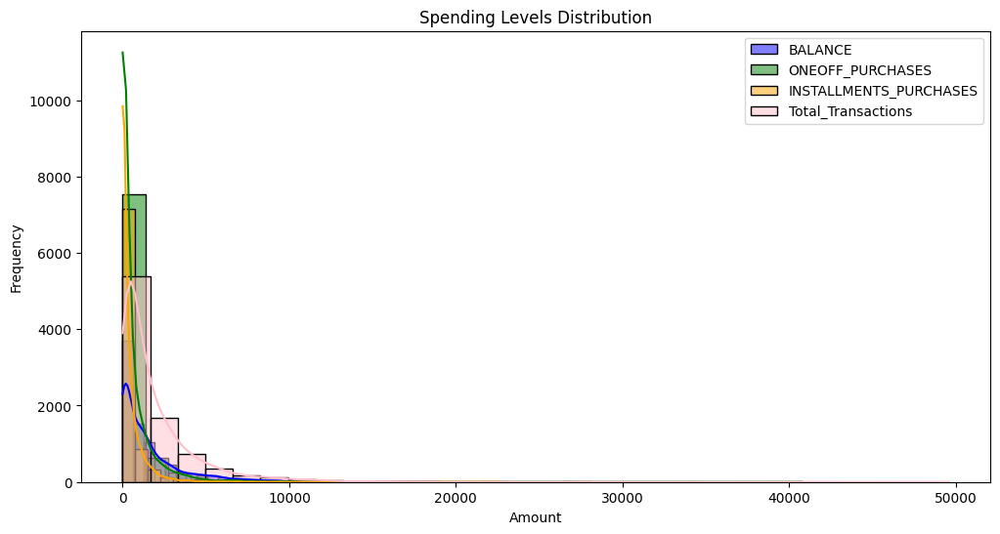

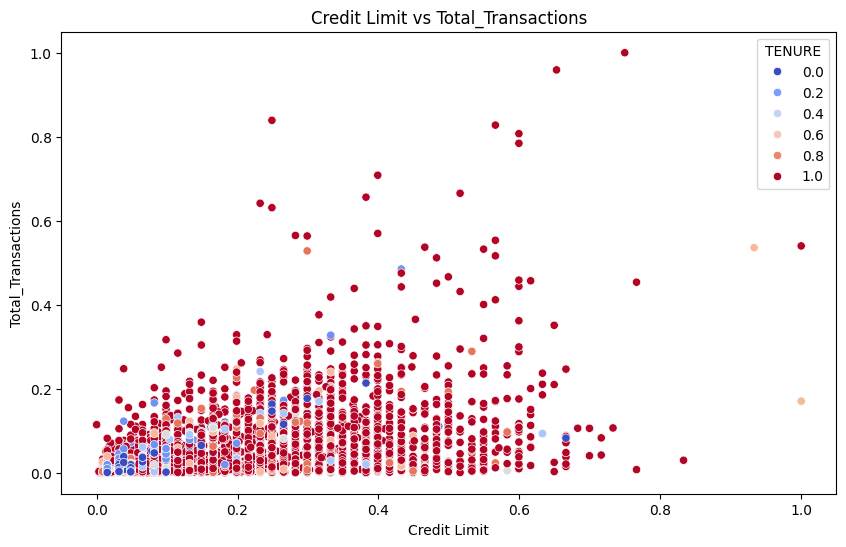

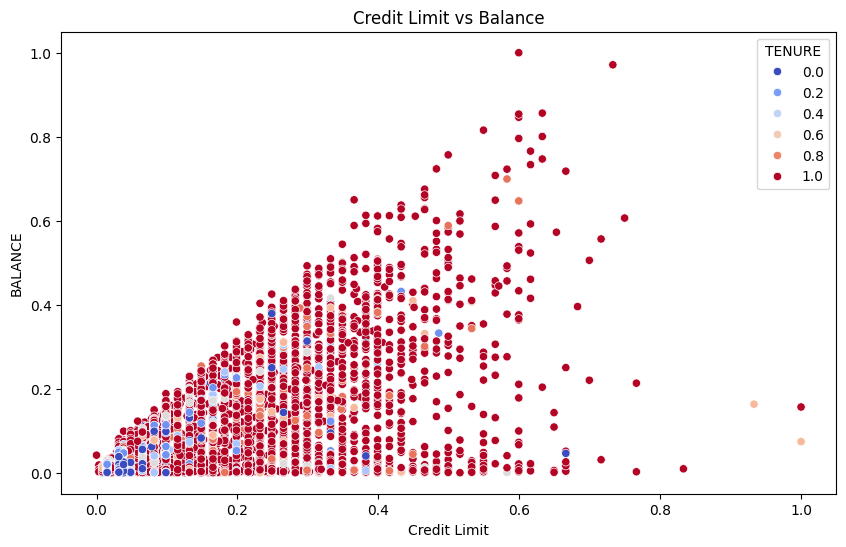

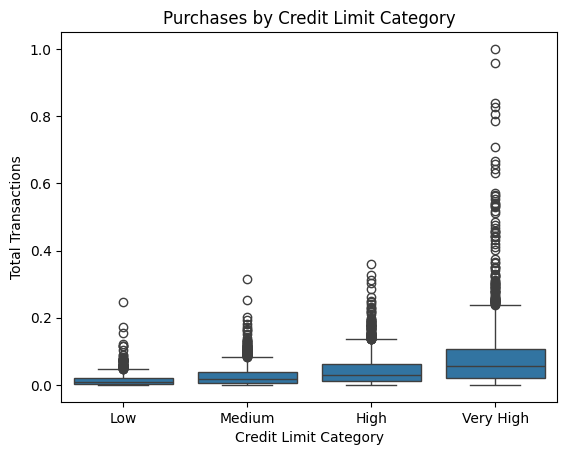

In [51]:
# Segment customers based on quantiles
high_oneoff_purchases = scaled_df[scaled_df['ONEOFF_PURCHASES'] > scaled_df['ONEOFF_PURCHASES'].quantile(0.75)]
high_installment_purchases = scaled_df[scaled_df['INSTALLMENTS_PURCHASES'] > scaled_df['INSTALLMENTS_PURCHASES'].quantile(0.75)]
high_total_transaction = scaled_df[scaled_df['Total_Transactions'] > scaled_df['Total_Transactions'].quantile(0.75)]

# Visualize spending levels with one plot
plt.figure(figsize=(12, 6))
for col, color in zip(['BALANCE', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'Total_Transactions'], ['blue', 'green', 'orange', 'pink']):
    sns.histplot(df[col], bins=30, kde=True, color=color, label=col)
plt.legend(); plt.title('Spending Levels Distribution'); plt.xlabel('Amount'); plt.ylabel('Frequency'); plt.show()

# Scatter plots for credit limit vs total transactions and balance
for y_col, title in zip(['Total_Transactions', 'BALANCE'], ['Credit Limit vs Total_Transactions', 'Credit Limit vs Balance']):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=scaled_df, x='CREDIT_LIMIT', y=y_col, hue='TENURE', palette='coolwarm')
    plt.title(title); plt.xlabel('Credit Limit'); plt.ylabel(y_col); plt.show()

# Boxplot for credit limits and total transactions
scaled_df['Credit_Limit_Category'] = pd.qcut(scaled_df['CREDIT_LIMIT'], 4, labels=['Low', 'Medium', 'High', 'Very High'])
sns.boxplot(x='Credit_Limit_Category', y='Total_Transactions', data=scaled_df)
plt.title('Purchases by Credit Limit Category'); plt.xlabel('Credit Limit Category'); plt.ylabel('Total Transactions'); plt.show()

The first graph shows a heavy concentration near zero, suggesting most customers have low spending across these features. The skewiness of the data (right skewed with a long tail) indicates a few outliers have higher spending habits. This shows high spenders are rare but important for clustering. The long-tail may cause a clustering model to form seperate clusters for these outliers. the graph also shows One-Off purchases (green) and Installment Purchases (yellow) are more tightly concentrated around zero indicting smaller purchase amounts in these categories.

The second graph shows only a slight increase in total transactions as the credit limit increases. It shows us that there are more total transactions with higher credit limits. This makes sense because there is more avaiable to spend on the card, but lower credit limits could equeally spend over a longer perdiod of time. There is no strong linear relationship seen here, suggesting other factors may play a more significant role. Maybe offering more credit options to users could increase their total purchase spend.

The third graph down shows a strong positive correlation between blaance and credit limit. Tenure also appears to influence balance and limit with no shorter tenured points in the higher ranges. Tenure may be a key feature in customer segmentation, especially for loyal or h-gh value customers.

This last graph shows us the spread of total transactions across credit limit categories. Here the distribution shows us that customers with similar credit limits do not necessarily have the same spending patterns, such as very high credit limit spenders that do not utiize their credit and others who maximize their limits. However, customers with low to high credit limit categories have tighter distributions suggesting customers with similar credit limits tend to behave similarily in their purchase beavhoiur.

PART C: Clustering Algorithms

In [52]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib.colors import ListedColormap

In [53]:
scaled_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8614 entries, 0 to 8613
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   BALANCE                           8614 non-null   float64 
 1   BALANCE_FREQUENCY                 8614 non-null   float64 
 2   ONEOFF_PURCHASES                  8614 non-null   float64 
 3   INSTALLMENTS_PURCHASES            8614 non-null   float64 
 4   PURCHASES_FREQUENCY               8614 non-null   float64 
 5   ONEOFF_PURCHASES_FREQUENCY        8614 non-null   float64 
 6   PURCHASES_INSTALLMENTS_FREQUENCY  8614 non-null   float64 
 7   CASH_ADVANCE_FREQUENCY            8614 non-null   float64 
 8   CASH_ADVANCE_TRX                  8614 non-null   float64 
 9   PURCHASES_TRX                     8614 non-null   float64 
 10  CREDIT_LIMIT                      8614 non-null   float64 
 11  PAYMENTS                          8614 non-null   float6

In [54]:
cluster_data = scaled_df.drop(columns=['Credit_Limit_Category'])

K-MEANS

We start with K-means because it is commonly used for customer segmentation.

In [55]:
# We use the elbow method to determine the most appropriate number of clusters.
k_values = range(1, 11)  # Testing k from 1 to 10
sse = [KMeans(n_clusters=k, random_state=42).fit(cluster_data).inertia_ for k in k_values]

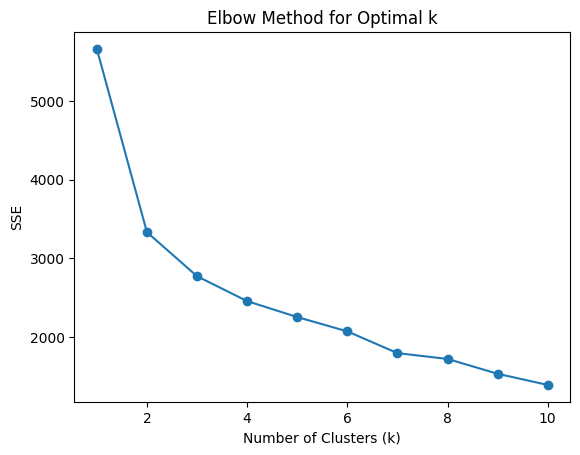

In [56]:
plt.plot(k_values, sse, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('SSE')
plt.title('Elbow Method for Optimal k')
plt.show()

In [57]:
# 3 appers to be optimal, but we try and compare three different amounts along the bend.
# Define the k values you want to try
k_values = [2, 3, 4, 6, 8]

# Loop through each k value, fit K-Means, and print the Silhouette Score
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(cluster_data)
    score = silhouette_score(cluster_data, kmeans.labels_)
    print(f'For k={k}, Silhouette Score: {score:.4f}')

For k=2, Silhouette Score: 0.3875
For k=3, Silhouette Score: 0.3732
For k=4, Silhouette Score: 0.3170
For k=6, Silhouette Score: 0.2869
For k=8, Silhouette Score: 0.2972


This suggests a 2-cluster solution would be best case hereee, but 2 clusters does not provide enough segmentation, and the lower score at 0.38 suggets some overlap.

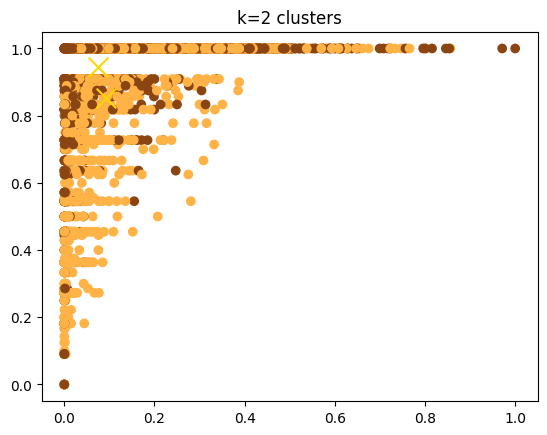

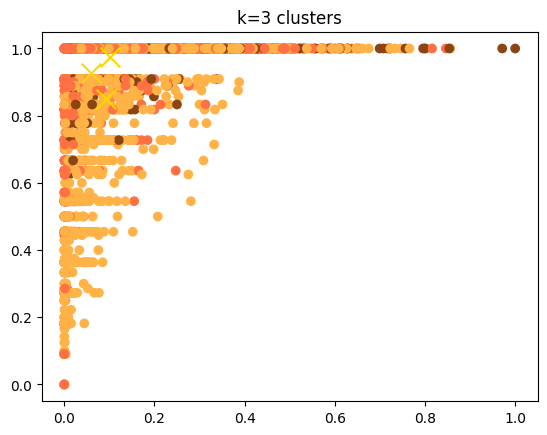

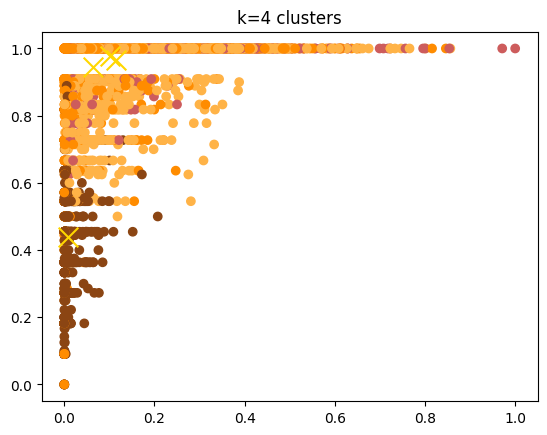

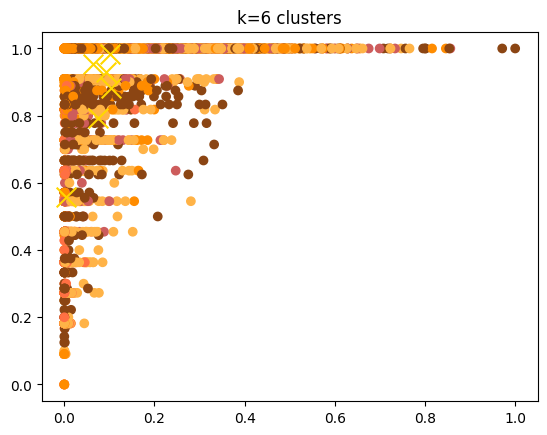

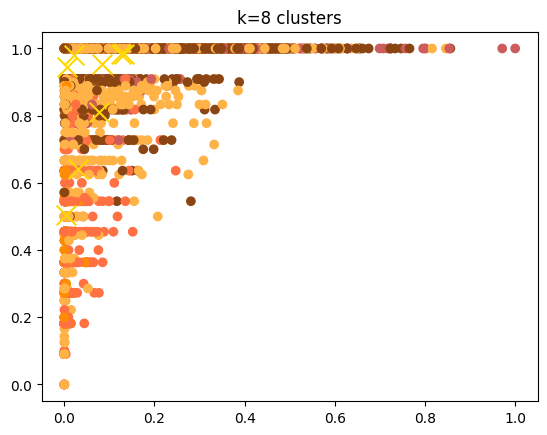

In [58]:
# To better understand the spread, we visualize the clusters.
# Define fall-themed colors
fall_colors = ListedColormap(['#FFB347', '#FF8C00', '#FF7043', '#CD5C5C', '#8B4513'])  # Orange and lighter brown shades
#
#  Loop to plot clusters and centroids
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(cluster_data)
    plt.scatter(cluster_data.iloc[:, 0], cluster_data.iloc[:, 1], c=kmeans.labels_, cmap=fall_colors)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='#FFD700', marker='x', s=200)
    plt.title(f'k={k} clusters')
    plt.show()

Given there are not distinct patterns clusters here, this could mean the data does not have clear lcusters, the data does not seperate easily into distinct groups. 
Given the non-normal distributions, k-means may does not ppear suitable for identifying clusters.

Change parmas for better results: Here we change the initialization process to add more inital start points for the clustering centroids, since the initial start point if too far off can result in a suboptimal sloution. To avoid this we run the K-mens algo ultiple times with 30 new randomw start points each time.

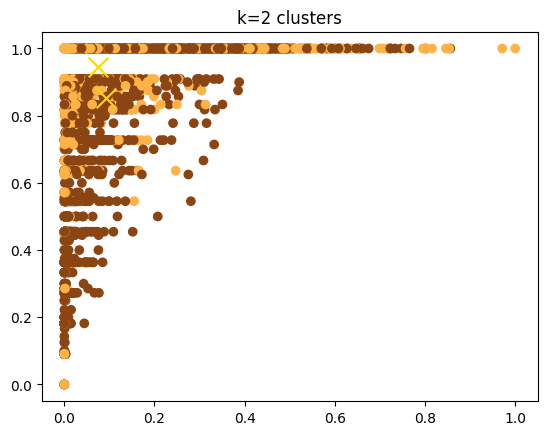

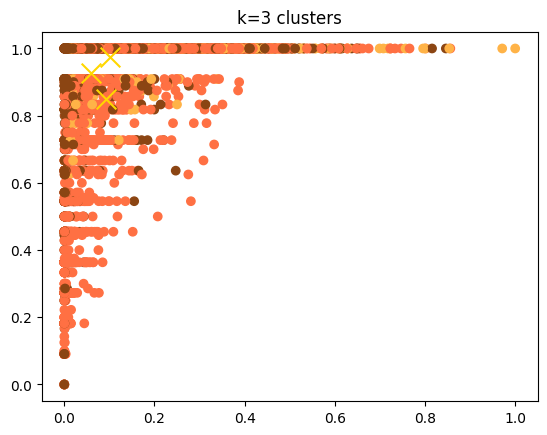

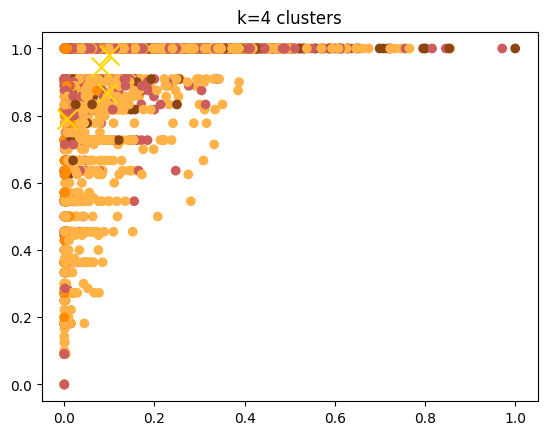

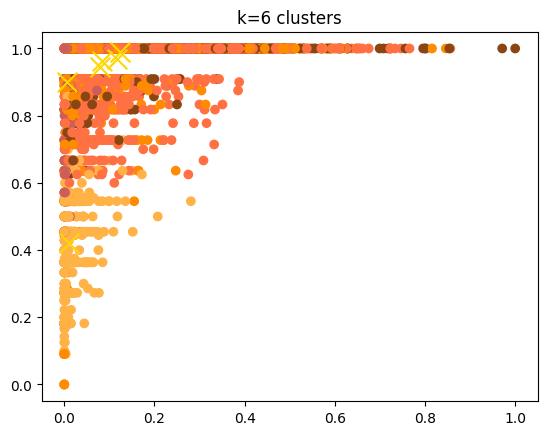

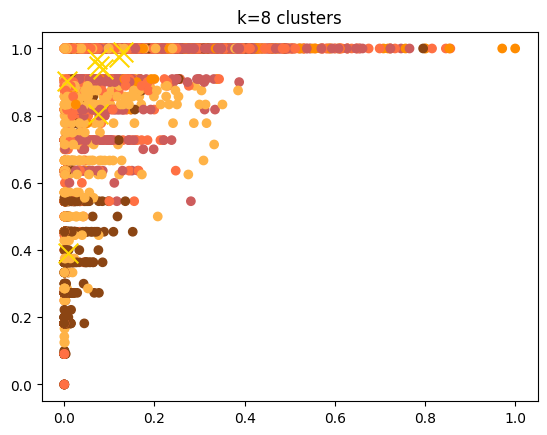

In [59]:
#  Loop to plot clusters and centroids
for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=30, random_state=42).fit(cluster_data)
    plt.scatter(cluster_data.iloc[:, 0], cluster_data.iloc[:, 1], c=kmeans.labels_, cmap=fall_colors)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='#FFD700', marker='x', s=200)
    plt.title(f'k={k} clusters')
    plt.show()

This does not improve the model in a meaningful way. We try running K-means with PCA results.

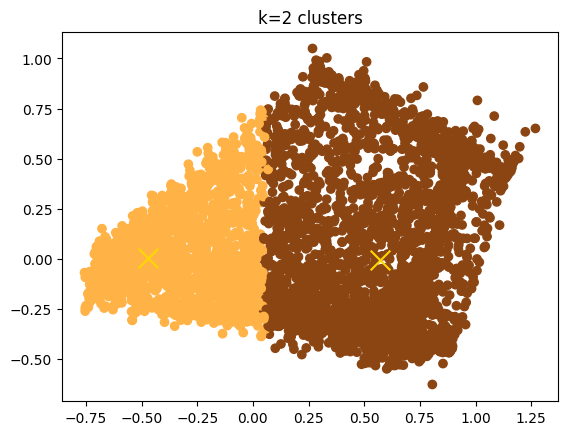

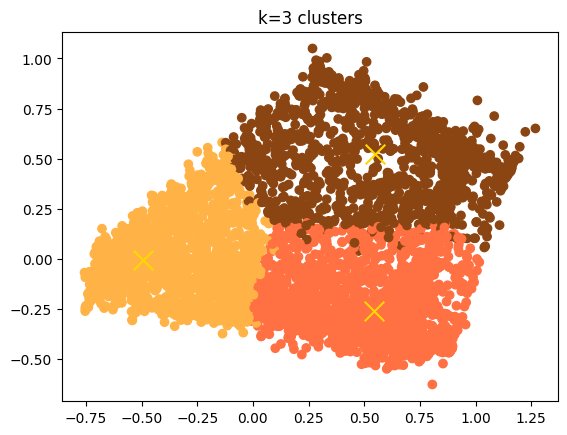

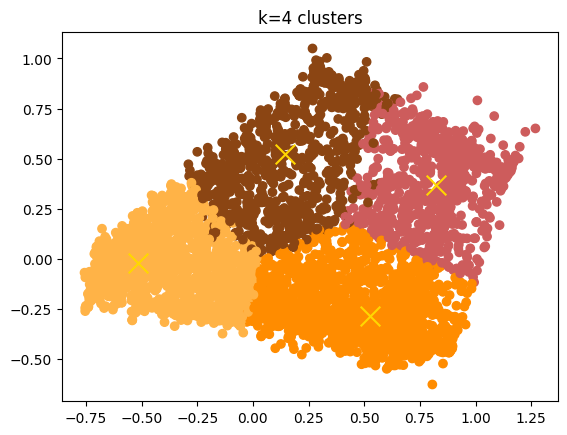

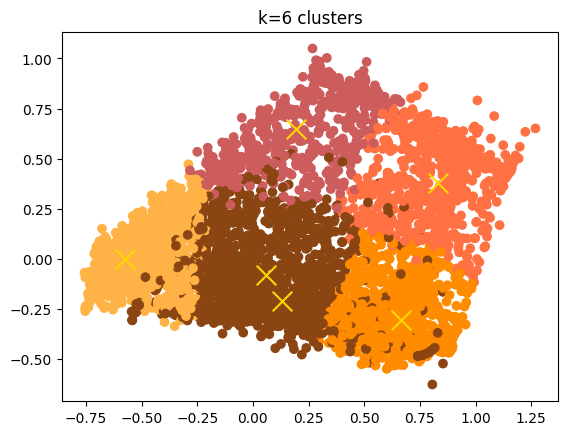

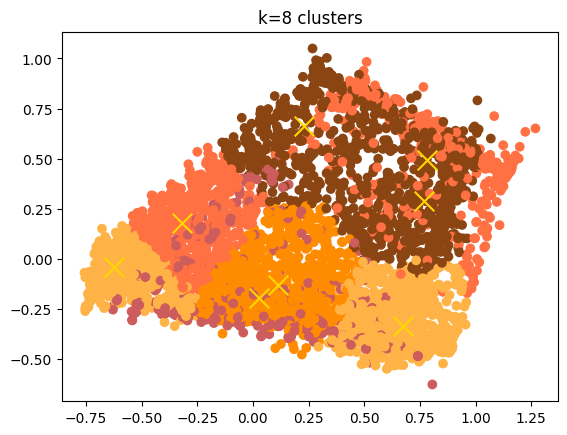

In [60]:
#  Loop to plot clusters and centroids
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(pca_df)
    plt.scatter(pca_df.iloc[:, 0], pca_df.iloc[:, 1], c=kmeans.labels_, cmap=fall_colors)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='#FFD700', marker='x', s=200)
    plt.title(f'k={k} clusters')
    plt.show()

Running K-means using PCA results SIGNIFICANTLY improves reults with better defined results. Although, there is still some overlap, suggesting there are other models to better semgment the clusters.

DBSCAN

In [61]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

In [62]:
# Changing name to avoid confusion.
model_data = scaled_df.drop(columns=['Credit_Limit_Category'])

We try this model because it is typically well-suited for dat that is not normally distributed. It can also identify clusters of arbitrary shape - assiting with the outliers in the data and skewed shape of the data. This model also adapts our data's varying density distribution. 

First we determine ideal hyperparamters.
Specifically eps, epsilon, and min_samples, min number of points, to better control out cluster output. 
We use a K-distance graph to determine optimal epsilon vlaues.

K-Distance Graph
N-neighbours started as 3 since this is standard.

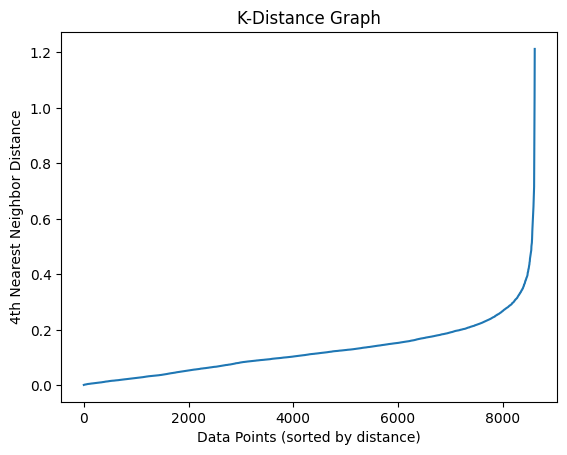

In [63]:
neighbors = NearestNeighbors(n_neighbors=3).fit(model_data)
distances, _ = neighbors.kneighbors(model_data)
plt.plot(np.sort(distances[:, 2]))
plt.title('K-Distance Graph')
plt.xlabel('Data Points (sorted by distance)')
plt.ylabel('4th Nearest Neighbor Distance')
plt.show()

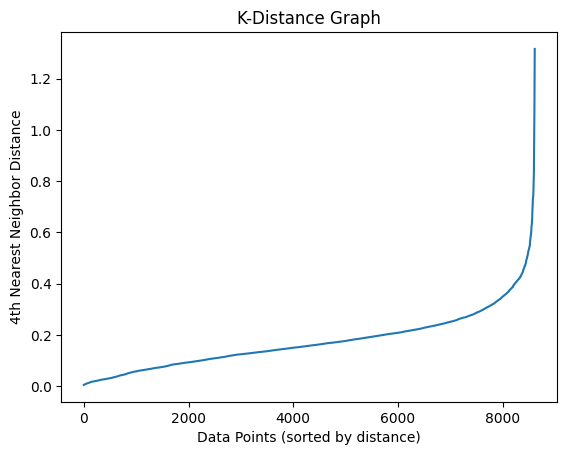

In [64]:
neighbors = NearestNeighbors(n_neighbors=10).fit(model_data)
distances, _ = neighbors.kneighbors(model_data)
plt.plot(np.sort(distances[:, 9]))
plt.title('K-Distance Graph')
plt.xlabel('Data Points (sorted by distance)')
plt.ylabel('4th Nearest Neighbor Distance')
plt.show()

Since the data is fairly homogenous there is no noticable effect in changing n-neighbours to 10, we see the optimal eps is 0.3 or 0.4.

In [65]:
model_data = model_data.values  # Ensures the data is in array form

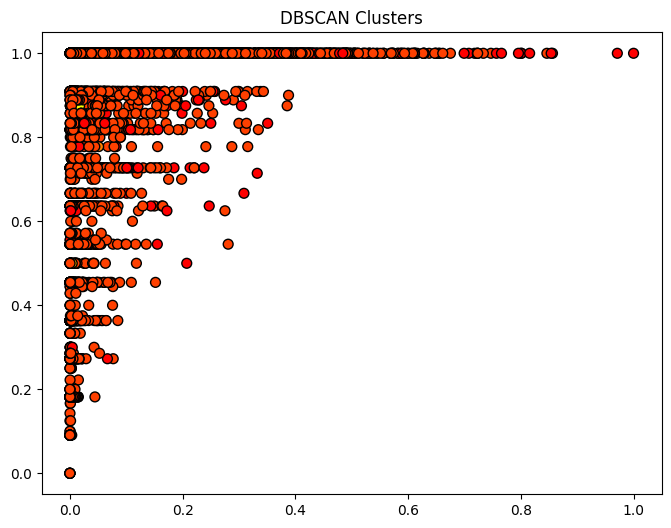

Unique Clusters: {np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(-1)}


In [66]:
# Initialize and fit DBSCAN
dbscan_model = DBSCAN(eps=0.3, min_samples=3)
dbscan_labels = dbscan_model.fit_predict(model_data)

# Visualize the DBSCAN clusters
plt.figure(figsize=(8, 6))
plt.scatter(model_data[:, 0], model_data[:, 1], c=dbscan_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('DBSCAN Clusters')
plt.show()

# Display the unique cluster labels (including noise)
unique_clusters = set(dbscan_labels)
print("Unique Clusters:", unique_clusters)

In [67]:
# Calculate the silhouette score
silhouette_avg = silhouette_score(model_data, dbscan_labels)
print(f'Silhouette Score: {silhouette_avg:.4f}')

Silhouette Score: -0.0009


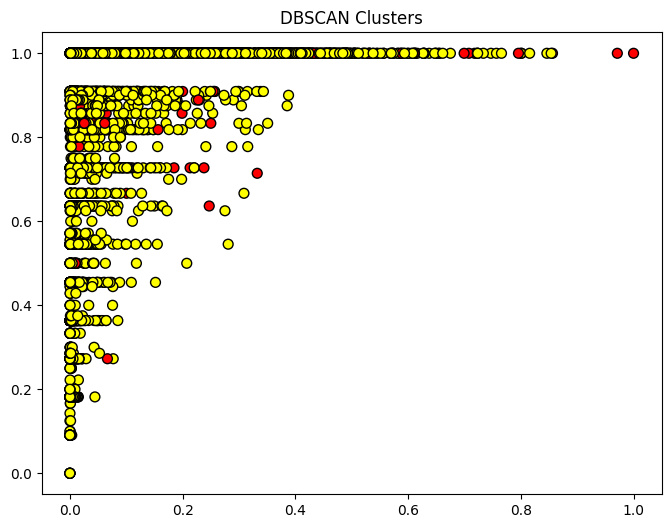

Unique Clusters: {np.int64(0), np.int64(-1)}


In [68]:
# We try different params

# Initialize and fit DBSCAN
dbscan_model = DBSCAN(eps=0.4, min_samples=9)
dbscan_labels = dbscan_model.fit_predict(model_data)

# Visualize the DBSCAN clusters
plt.figure(figsize=(8, 6))
plt.scatter(model_data[:, 0], model_data[:, 1], c=dbscan_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('DBSCAN Clusters')
plt.show()

# Display the unique cluster labels (including noise)
unique_clusters = set(dbscan_labels)
print("Unique Clusters:", unique_clusters)

In [69]:
# Calculate the silhouette score
silhouette_avg = silhouette_score(model_data, dbscan_labels)
print(f'Silhouette Score: {silhouette_avg:.4f}')

Silhouette Score: 0.2746


Both times the model performs poorly. Let's use PCA results on the model.

In [70]:
# Convert DataFrame to numpy array for plotting
pca_df = pca_df.values

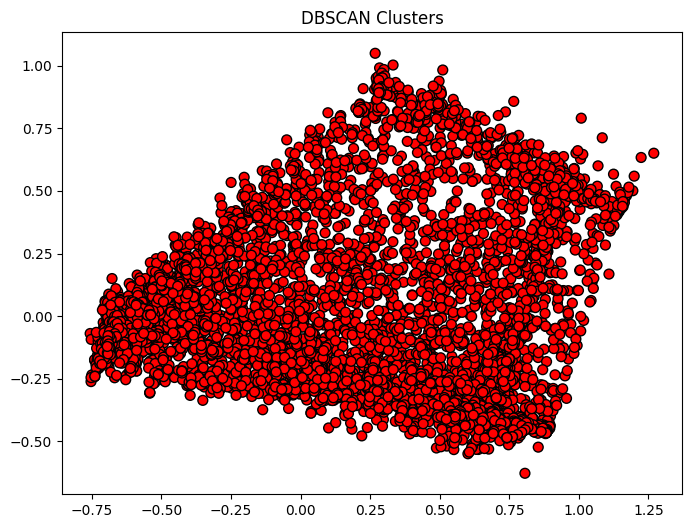

Unique Clusters: {np.int64(0)}


In [71]:
# Initialize and fit DBSCAN
dbscan_model = DBSCAN(eps=0.3, min_samples=3)
dbscan_labels = dbscan_model.fit_predict(pca_df)

# Visualize the DBSCAN clusters
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=dbscan_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('DBSCAN Clusters')
plt.show()

# Display the unique cluster labels (including noise)
unique_clusters = set(dbscan_labels)
print("Unique Clusters:", unique_clusters)

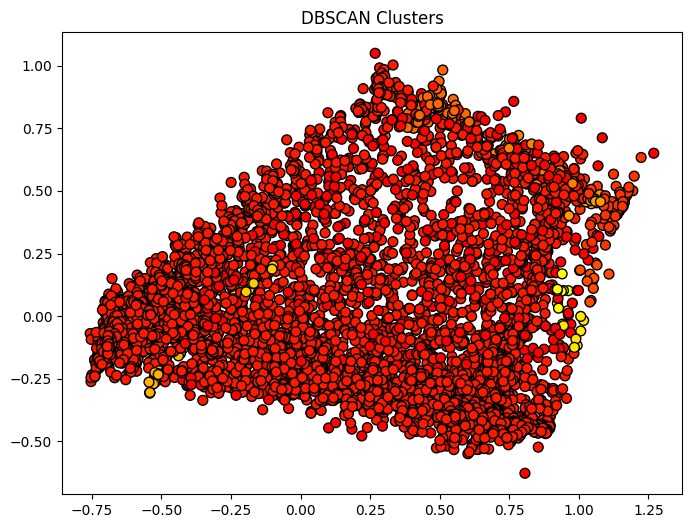

Unique Clusters: {np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(-1)}


In [72]:
# Initialize and fit DBSCAN
dbscan_model = DBSCAN(eps=0.10, min_samples=10)
dbscan_labels = dbscan_model.fit_predict(pca_df)

# Visualize the DBSCAN clusters
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=dbscan_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('DBSCAN Clusters')
plt.show()

# Display the unique cluster labels (including noise)
unique_clusters = set(dbscan_labels)
print("Unique Clusters:", unique_clusters)

No meaningful results here.

GAUSSIAN MIXTURE MODEl (GMM)

We try this model because of its ability to form clusters based on point prbabilites, it captures more complex shapes like our model, and there is flexibility in params.

In [73]:
from sklearn.mixture import GaussianMixture

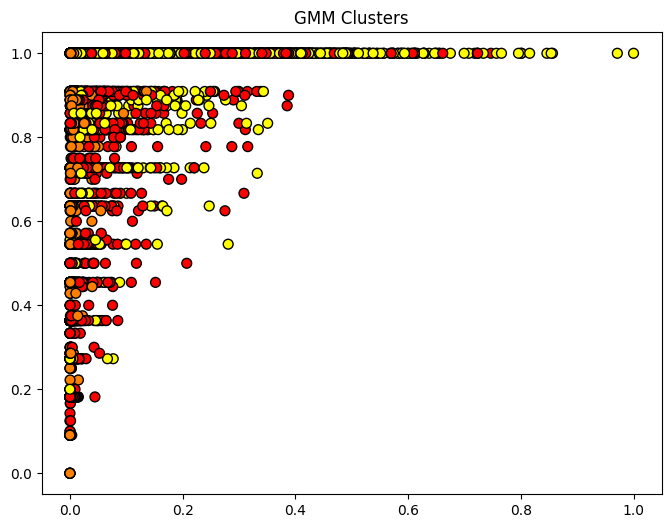

BIC: -510790.8694154724
AIC: -514024.8733975236
Silhouette Score: 0.1401


In [74]:
# Initialize the GMM model with 3 clusters
gmm = GaussianMixture(n_components=3, random_state=42)

# Fit the model to the data (use the PCA data or scaled data)
gmm.fit(model_data)

# Predict cluster labels
gmm_labels = gmm.predict(model_data)

# Plot the GMM clustering results
plt.figure(figsize=(8, 6))
plt.scatter(model_data[:, 0], model_data[:, 1], c=gmm_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('GMM Clusters')
plt.show()

# Evaluate using BIC, AIC, and Silhouette Score
bic = gmm.bic(model_data)
aic = gmm.aic(model_data)
silhouette_avg = silhouette_score(model_data, gmm_labels)

print(f'BIC: {bic}')
print(f'AIC: {aic}')
print(f'Silhouette Score: {silhouette_avg:.4f}')

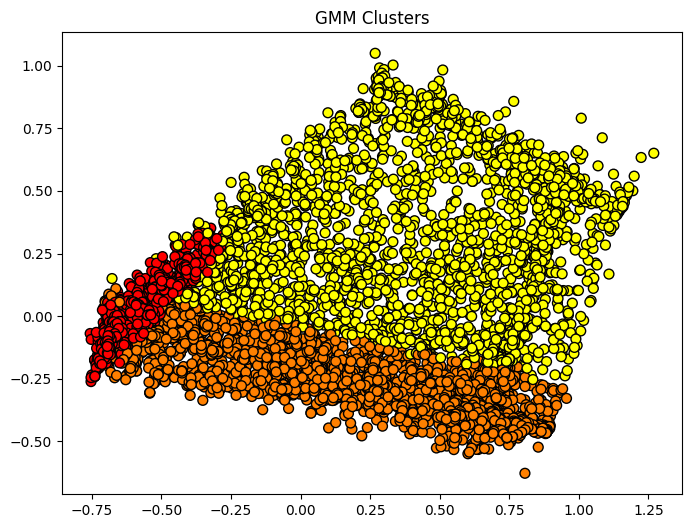

BIC: -3354.077650743425
AIC: -3558.8508286462325
Silhouette Score: 0.3309


In [75]:
#PCA
# Fit the model to the data
gmm.fit(pca_df)

# Predict cluster labels
gmm_labels = gmm.predict(pca_df)

# Plot the GMM clustering results
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=gmm_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('GMM Clusters')
plt.show()

# Evaluate using BIC, AIC, and Silhouette Score
bic = gmm.bic(pca_df)
aic = gmm.aic(pca_df)
silhouette_avg = silhouette_score(pca_df, gmm_labels)

print(f'BIC: {bic}')
print(f'AIC: {aic}')
print(f'Silhouette Score: {silhouette_avg:.4f}')

Slightly less silhoutte score to k-means PCA model

PCA GMM has some distinct clusters. Lets hypterune the params to see if it can be better.

In [76]:
# Define a range for the number of components (clusters)
n_components_range = range(2, 10)
best_bic = np.inf  # Initialize best BIC as a very high number
best_gmm = None  # To store the best model
best_n = 0  # To store the best number of components

# Loop over the range of components
for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(pca_df)
    
    # Compute BIC and AIC
    bic = gmm.bic(pca_df)
    aic = gmm.aic(pca_df)
    
    # Update if we find a better BIC
    if bic < best_bic:
        best_bic = bic
        best_gmm = gmm
        best_n = n_components

# Fit the best model and predict labels
gmm_labels = best_gmm.predict(pca_df)
print(f'Best number of components (based on BIC): {best_n}')
print(f'Best BIC: {best_bic}')

Best number of components (based on BIC): 9
Best BIC: -18502.31853142272


This has identified 9 as the ideal components (clusterS). The lwoer BIC score compparitively means these params offer a better balance between model fit and complexity.
We try the GMM model with 9 clusters.

Silhouette Score for 9 clusters: 0.0692


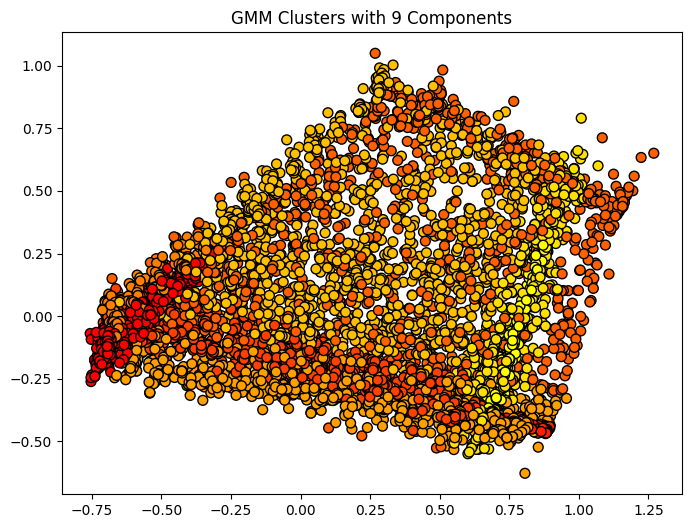

In [81]:
# Initialize and fit the GMM model with 9 components
gmm = GaussianMixture(n_components=9, random_state=42)
gmm.fit(pca_df)

# Predict the cluster labels
gmm_labels = gmm.predict(pca_df)

# Calculate the Silhouette Score
silhouette_avg = silhouette_score(pca_df, gmm_labels)
print(f'Silhouette Score for 9 clusters: {silhouette_avg:.4f}')

# Visualize the clusters
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=gmm_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('GMM Clusters with 9 Components')
plt.show()

This has a terrible silhouette score. We lok at 3 and 4 clusters with other covariance ttypes since 3 clusters has the best Sil score so far.

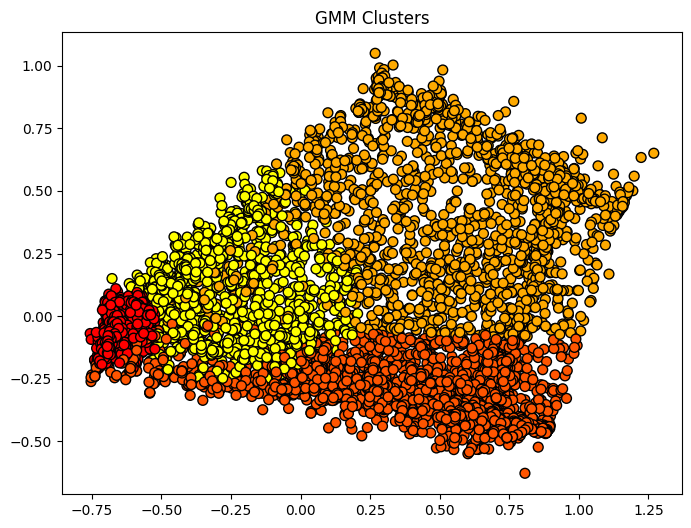

BIC: 1706.8967588233381
AIC: 1516.2458690517585
Silhouette Score: 0.3194


In [89]:
gmm = GaussianMixture(n_components=4, covariance_type='diag', random_state=42)
gmm.fit(pca_df)

# Predict cluster labels
gmm_labels = gmm.predict(pca_df)

# Plot the GMM clustering results
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=gmm_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('GMM Clusters')
plt.show()

# Evaluate using BIC, AIC, and Silhouette Score
bic = gmm.bic(pca_df)
aic = gmm.aic(pca_df)
silhouette_avg = silhouette_score(pca_df, gmm_labels)

print(f'BIC: {bic}')
print(f'AIC: {aic}')
print(f'Silhouette Score: {silhouette_avg:.4f}')

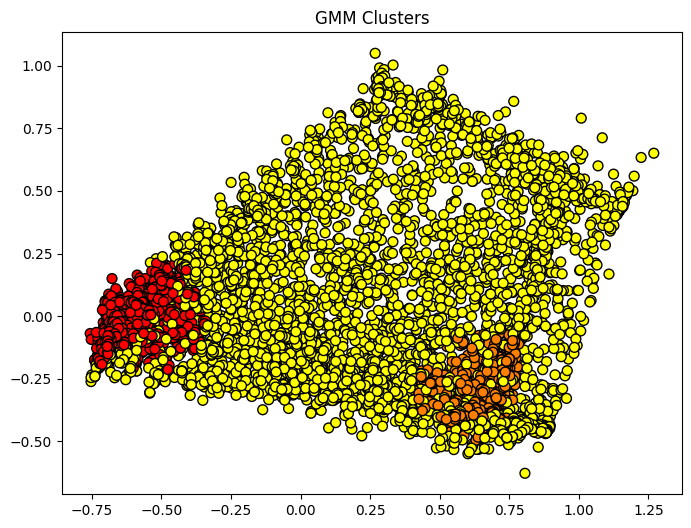

BIC: 4804.38837791032
AIC: 4705.532360991723
Silhouette Score: 0.2556


In [91]:
gmm = GaussianMixture(n_components=3, covariance_type='spherical', random_state=42)
gmm.fit(pca_df)

# Predict cluster labels
gmm_labels = gmm.predict(pca_df)

# Plot the GMM clustering results
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=gmm_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('GMM Clusters')
plt.show()

# Evaluate using BIC, AIC, and Silhouette Score
bic = gmm.bic(pca_df)
aic = gmm.aic(pca_df)
silhouette_avg = silhouette_score(pca_df, gmm_labels)

print(f'BIC: {bic}')
print(f'AIC: {aic}')
print(f'Silhouette Score: {silhouette_avg:.4f}')

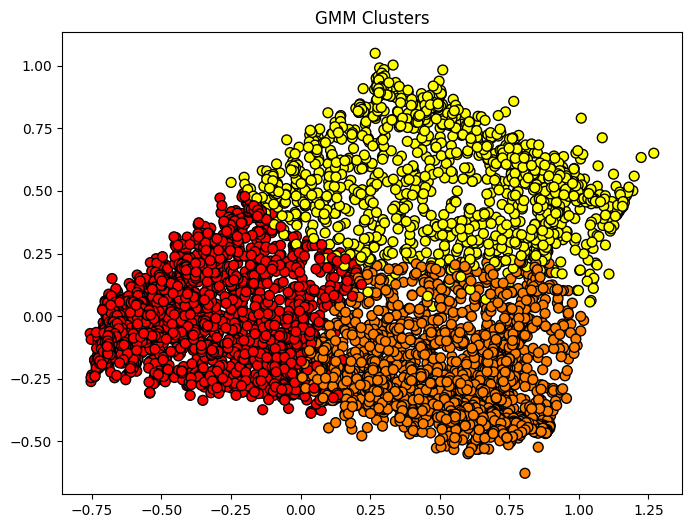

BIC: 13050.523027746345
AIC: 12930.483578630907
Silhouette Score: 0.5001


In [84]:
gmm = GaussianMixture(n_components=3, covariance_type='tied', random_state=42)
gmm.fit(pca_df)

# Predict cluster labels
gmm_labels = gmm.predict(pca_df)

# Plot the GMM clustering results
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=gmm_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('GMM Clusters')
plt.show()

# Evaluate using BIC, AIC, and Silhouette Score
bic = gmm.bic(pca_df)
aic = gmm.aic(pca_df)
silhouette_avg = silhouette_score(pca_df, gmm_labels)

print(f'BIC: {bic}')
print(f'AIC: {aic}')
print(f'Silhouette Score: {silhouette_avg:.4f}')

This model looks good. Lets try with 4 clusers just to see if this is the best score here.

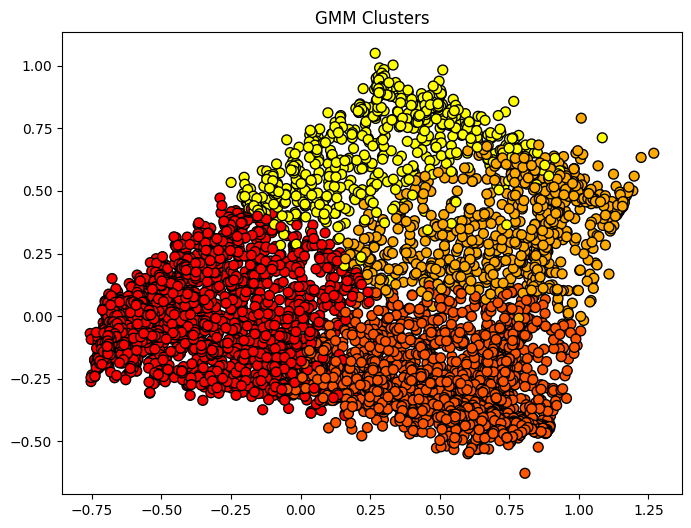

BIC: 11328.38253612256
AIC: 11180.098510744665
Silhouette Score: 0.4615


In [92]:
gmm = GaussianMixture(n_components=4, covariance_type='tied', random_state=42)
gmm.fit(pca_df)

# Predict cluster labels
gmm_labels = gmm.predict(pca_df)

# Plot the GMM clustering results
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=gmm_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('GMM Clusters')
plt.show()

# Evaluate using BIC, AIC, and Silhouette Score
bic = gmm.bic(pca_df)
aic = gmm.aic(pca_df)
silhouette_avg = silhouette_score(pca_df, gmm_labels)

print(f'BIC: {bic}')
print(f'AIC: {aic}')
print(f'Silhouette Score: {silhouette_avg:.4f}')

Clusters look nice here as well. But it has a slightly less sil score. Lets further tune both.

Lets try another search on GMM for optimal params.
We use sil score as evaluation metric because it seems to offer a better insight into clear clusters

In [94]:
# Define parameter grid
param_grid = {
    'n_components': [3, 5, 7, 9],
    'covariance_type': ['full', 'tied', 'diag', 'spherical'],
    'tol': [1e-3, 1e-4],
    'reg_covar': [1e-6, 1e-5, 1e-4]
}

best_score, best_params = -1, None

# Grid search loop
for n in param_grid['n_components']:
    for cov in param_grid['covariance_type']:
        for tol in param_grid['tol']:
            for reg in param_grid['reg_covar']:
                gmm = GaussianMixture(n_components=n, covariance_type=cov, tol=tol, reg_covar=reg, random_state=42).fit(pca_df)
                score = silhouette_score(model_data, gmm.predict(pca_df))
                if score > best_score:
                    best_score, best_params = score, {'n_components': n, 'covariance_type': cov, 'tol': tol, 'reg_covar': reg}
                print(f'n={n}, cov={cov}, tol={tol}, reg={reg} -> Silhouette Score: {score:.4f}')

print(f'Best Silhouette Score: {best_score:.4f}, Best Params: {best_params}')

n=3, cov=full, tol=0.001, reg=1e-06 -> Silhouette Score: 0.2366
n=3, cov=full, tol=0.001, reg=1e-05 -> Silhouette Score: 0.2368
n=3, cov=full, tol=0.001, reg=0.0001 -> Silhouette Score: 0.2395
n=3, cov=full, tol=0.0001, reg=1e-06 -> Silhouette Score: 0.2328
n=3, cov=full, tol=0.0001, reg=1e-05 -> Silhouette Score: 0.2335
n=3, cov=full, tol=0.0001, reg=0.0001 -> Silhouette Score: 0.2359
n=3, cov=tied, tol=0.001, reg=1e-06 -> Silhouette Score: 0.3759
n=3, cov=tied, tol=0.001, reg=1e-05 -> Silhouette Score: 0.3759
n=3, cov=tied, tol=0.001, reg=0.0001 -> Silhouette Score: 0.3759
n=3, cov=tied, tol=0.0001, reg=1e-06 -> Silhouette Score: 0.3761
n=3, cov=tied, tol=0.0001, reg=1e-05 -> Silhouette Score: 0.3761
n=3, cov=tied, tol=0.0001, reg=0.0001 -> Silhouette Score: 0.3761
n=3, cov=diag, tol=0.001, reg=1e-06 -> Silhouette Score: 0.1617
n=3, cov=diag, tol=0.001, reg=1e-05 -> Silhouette Score: 0.1619
n=3, cov=diag, tol=0.001, reg=0.0001 -> Silhouette Score: 0.1647
n=3, cov=diag, tol=0.0001, re

BIC: 13049.000419374108
Silhouette Score: 0.5002


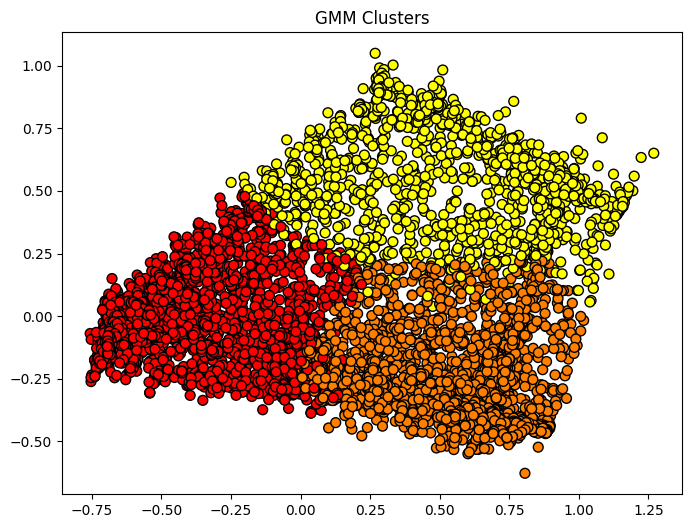

In [108]:
#Lets see the model with the given params output obove.
gmm_best = GaussianMixture(n_components=3, covariance_type='tied', tol=0.0001, reg_covar=0.0001, random_state=42)
gmm_best.fit(pca_df)

# Predict the cluster labels
gmm_labels = gmm_best.predict(pca_df)

# Calculate and print BIC score
bic_score = gmm_best.bic(pca_df)
silhouette_avg = silhouette_score(pca_df, gmm_labels)
print(f'BIC: {bic_score}')
print(f'Silhouette Score: {silhouette_avg:.4f}')

# Plot the GMM clustering results
plt.figure(figsize=(8, 6))
plt.scatter(pca_df[:, 0], pca_df[:, 1], c=gmm_labels, cmap='autumn', marker='o', edgecolor='k', s=50)
plt.title('GMM Clusters')
plt.show()

BEST sil score and close to our original without tuning. Slightly better BIC score here, but likely an insignificant change in overall complexity comparatively.

We try one last model to check for improvements.

Hierarchical

In [102]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

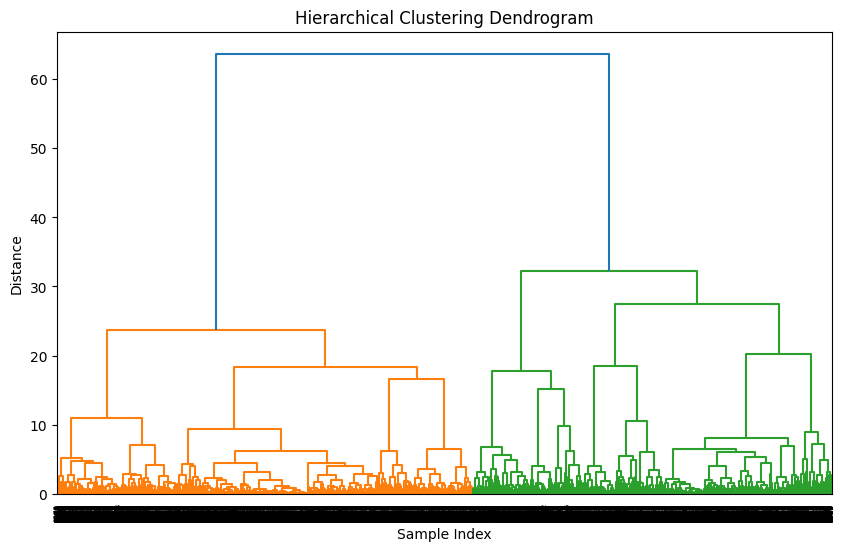

Silhouette Score for hierarchical clustering: 0.3359


In [96]:
# Perform hierarchical clustering using the Ward's method
Z = linkage(model_data, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

# Calculate and print the Silhouette Score for the hierarchical clustering
silhouette_avg = silhouette_score(model_data, cluster_labels)
print(f'Silhouette Score for hierarchical clustering: {silhouette_avg:.4f}')

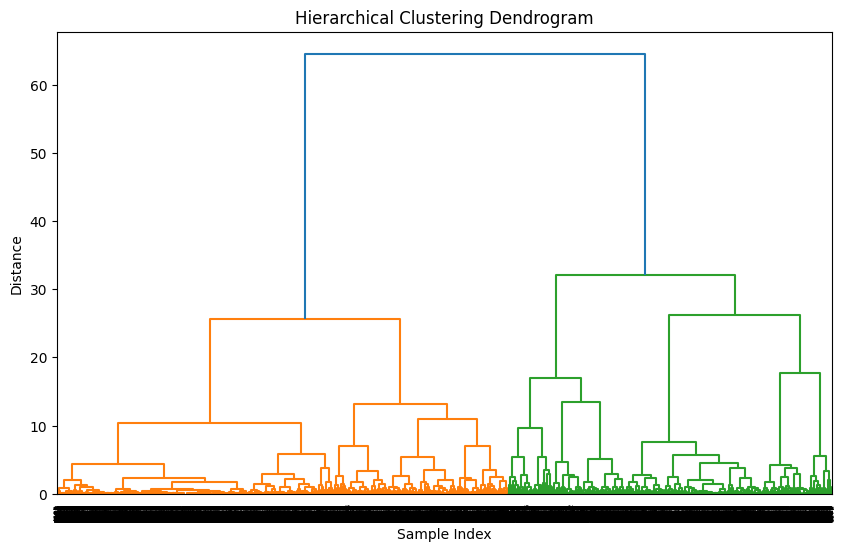

Silhouette Score for hierarchical clustering: 0.4399


In [100]:
# PCA
# Perform hierarchical clustering using the Ward's method
Z = linkage(pca_df, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

# Calculate and print the Silhouette Score for the hierarchical clustering
silhouette_avg = silhouette_score(pca_df, cluster_labels)
print(f'Silhouette Score for hierarchical clustering: {silhouette_avg:.4f}')

Based on the clear cluster seperation for both PCA data and original data, we hypertune based on original model. Since mostly we've worked with the PCA data, maybe using original data will allow this model to capture misunderstood or complex relationships.

In [101]:
# Define parameter grid
linkage_methods = ['ward', 'complete', 'average', 'single']
n_clusters_list = [2, 3, 4, 5]

best_score, best_params = -1, None

# Loop through different linkage methods and number of clusters
for method in linkage_methods:
    Z = linkage(model_data, method=method)
    for n_clusters in n_clusters_list:
        # Assign cluster labels
        cluster_labels = fcluster(Z, n_clusters, criterion='maxclust')
        
        # Calculate Silhouette Score
        sil_score = silhouette_score(model_data, cluster_labels)
        
        # Track the best score and parameters
        if sil_score > best_score:
            best_score, best_params = sil_score, {'linkage_method': method, 'n_clusters': n_clusters}
        print(f'Linkage: {method}, n_clusters: {n_clusters} -> Silhouette Score: {sil_score:.4f}')

# Print the best parameters and best silhouette score
print(f'Best Silhouette Score: {best_score:.4f}')
print(f'Best Parameters: {best_params}')

Linkage: ward, n_clusters: 2 -> Silhouette Score: 0.3512
Linkage: ward, n_clusters: 3 -> Silhouette Score: 0.3359
Linkage: ward, n_clusters: 4 -> Silhouette Score: 0.3343
Linkage: ward, n_clusters: 5 -> Silhouette Score: 0.2219
Linkage: complete, n_clusters: 2 -> Silhouette Score: 0.3751
Linkage: complete, n_clusters: 3 -> Silhouette Score: 0.3699
Linkage: complete, n_clusters: 4 -> Silhouette Score: 0.3650
Linkage: complete, n_clusters: 5 -> Silhouette Score: 0.3288
Linkage: average, n_clusters: 2 -> Silhouette Score: 0.4589
Linkage: average, n_clusters: 3 -> Silhouette Score: 0.4295
Linkage: average, n_clusters: 4 -> Silhouette Score: 0.3989
Linkage: average, n_clusters: 5 -> Silhouette Score: 0.3019
Linkage: single, n_clusters: 2 -> Silhouette Score: 0.4632
Linkage: single, n_clusters: 3 -> Silhouette Score: 0.3997
Linkage: single, n_clusters: 4 -> Silhouette Score: 0.3989
Linkage: single, n_clusters: 5 -> Silhouette Score: 0.3359
Best Silhouette Score: 0.4632
Best Parameters: {'lin

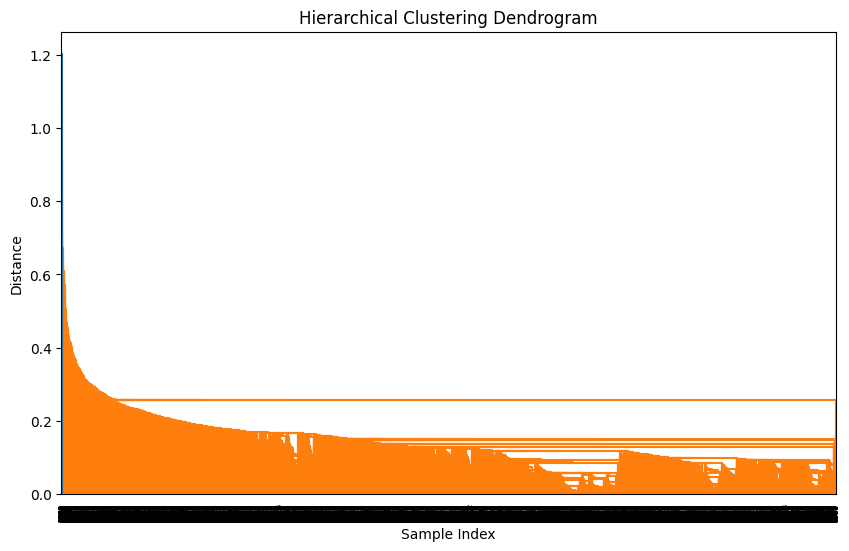

Silhouette Score: 0.4632


In [109]:
# Perform hierarchical clustering using the best linkage method ('single')
Z = linkage(model_data, method='single')

# Plot the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

# Extract flat clusters for n_clusters=2
cluster_labels = fcluster(Z, 2, criterion='maxclust')

# Calculate the Silhouette Score
silhouette_avg = silhouette_score(model_data, cluster_labels)
print(f'Silhouette Score: {silhouette_avg:.4f}')

Clusters appear dense and indistinguishable.

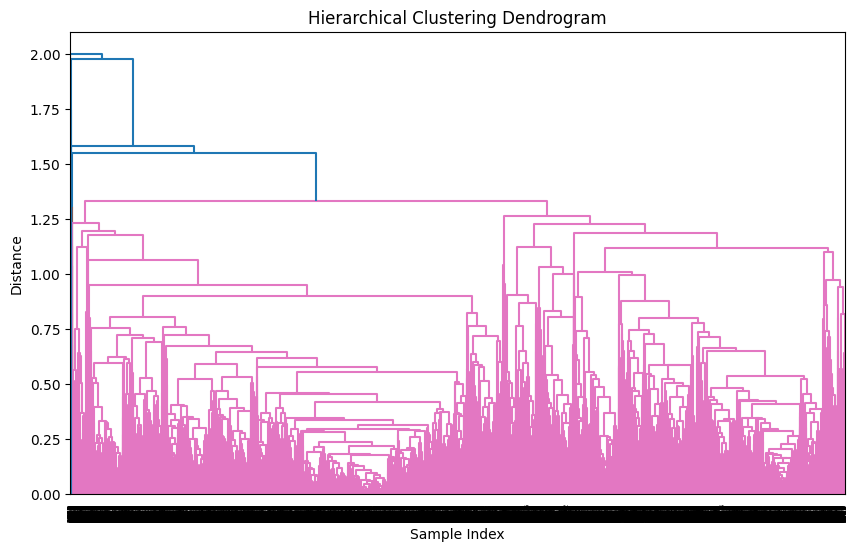

Silhouette Score: 0.4295


In [110]:
# Perform hierarchical clustering using the best linkage method ('single')
Z = linkage(model_data, method='average')

# Plot the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

# Extract flat clusters for n_clusters=3
cluster_labels = fcluster(Z, 3, criterion='maxclust')

# Calculate the Silhouette Score
silhouette_avg = silhouette_score(model_data, cluster_labels)
print(f'Silhouette Score: {silhouette_avg:.4f}')

Not many improvements here. We will go with our Best GMM model because it generates the best scores, with the clearest, equally dense clusters.

PART 4: Interpreting Clusters

We chose the GMM PCA model with params = (n_components=3, covariance_type='tied', tol=0.0001, reg_covar=0.0001, random_state=42). We look at the impact of each feautre on hte models outcome.

In [164]:
# Drop column from scaled df to align columns for processing.
scaled_df = scaled_df.drop('Credit_Limit_Category', axis=1)

KeyError: "['Credit_Limit_Category'] not found in axis"

Analyze the key features driving each cluster. 

In [187]:
# Get PCA loadings from the already fitted PCA model
loadings = pca.components_.T

These loadings tell us the facotrs and their influcne on the corresponding princpal component.
We sort them by descending to determine the top influencing features

In [140]:
# Create a DataFrame with the loadings
loadings_df = pd.DataFrame(loadings, columns=[f'PC{i+1}' for i in range(loadings.shape[1])], index=scaled_df.columns)

# Sort the loadings for each principal component in descending order of absolute values
sorted_loadings = loadings_df.apply(lambda x: x.abs().sort_values(ascending=False))

# Show the sorted loadings
sorted_loadings

,PC1,PC2,PC3
BALANCE,0.018372,0.079251,0.165216
BALANCE_FREQUENCY,0.083212,0.152770,0.333661
CASH_ADVANCE_FREQUENCY,0.077754,0.036854,0.120239
CASH_ADVANCE_TRX,0.021400,0.013539,0.038994
CREDIT_LIMIT,0.030136,0.131371,0.018915
INSTALLMENTS_PURCHASES,0.035571,0.002605,0.005940
MINIMUM_PAYMENTS,0.001216,0.010291,0.073019
ONEOFF_PURCHASES,0.020285,0.061554,0.007479
ONEOFF_PURCHASES_FREQUENCY,0.244686,0.853323,0.071422
PAYMENTS,0.013504,0.044337,0.003909


In [134]:
# PCA1 sorted
sorted_loadings_pc1 = loadings_df['PC1'].abs().sort_values(ascending=False)
sorted_loadings_pc1

PURCHASES_FREQUENCY                 0.685319
PURCHASES_INSTALLMENTS_FREQUENCY    0.638314
ONEOFF_PURCHASES_FREQUENCY          0.244686
PRC_FULL_PAYMENT                    0.198821
BALANCE_FREQUENCY                   0.083212
CASH_ADVANCE_FREQUENCY              0.077754
PURCHASES_TRX                       0.075494
INSTALLMENTS_PURCHASES              0.035571
TENURE                              0.031592
CREDIT_LIMIT                        0.030136
CASH_ADVANCE_TRX                    0.021400
ONEOFF_PURCHASES                    0.020285
BALANCE                             0.018372
Total_Transactions                  0.016169
PAYMENTS                            0.013504
MINIMUM_PAYMENTS                    0.001216
Name: PC1, dtype: float64

Features affecting:
1. purchase frequency (69%) The variability in PCA1 is highly influenced by how often customers make purchases.
2. purchases installments frequency(64%) Installment purcahses are also a key factor in variabiklity.
These also play a smaller role:
ONEOFF_PURCHASES_FREQUENCY          0.244686
PRC_FULL_PAYMENT                    0.198821
BALANCE_FREQUENCY                   0.083212
CASH_ADVANCE_FREQUENCY              0.077754
PURCHASES_TRX                       0.075494

In [137]:
# PCA2 sorted
sorted_loadings_pc2 = loadings_df['PC2'].abs().sort_values(ascending=False)
sorted_loadings_pc2

ONEOFF_PURCHASES_FREQUENCY          0.853323
PURCHASES_INSTALLMENTS_FREQUENCY    0.436096
BALANCE_FREQUENCY                   0.152770
CREDIT_LIMIT                        0.131371
TENURE                              0.088404
PURCHASES_FREQUENCY                 0.087403
BALANCE                             0.079251
PURCHASES_TRX                       0.065754
PRC_FULL_PAYMENT                    0.064554
ONEOFF_PURCHASES                    0.061554
Total_Transactions                  0.058550
PAYMENTS                            0.044337
CASH_ADVANCE_FREQUENCY              0.036854
CASH_ADVANCE_TRX                    0.013539
MINIMUM_PAYMENTS                    0.010291
INSTALLMENTS_PURCHASES              0.002605
Name: PC2, dtype: float64

Features affecting:
1. oneoff purchases frequency (85%) The variability in PCA2 is highly influenced by the maximum amount of indivudal transactions.
2. purchases installments frequency(44%) Installment purcahses are also a key factor in PC2's variabiklity.
These also play a smaller role:
BALANCE_FREQUENCY                   0.152770
CREDIT_LIMIT                        0.131371
TENURE                              0.088404
PURCHASES_FREQUENCY                 0.087403
BALANCE                             0.079251
PURCHASES_TRX                       0.065754
PRC_FULL_PAYMENT                    0.064554
ONEOFF_PURCHASES                    0.061554
Total_Transactions                  0.058550

In [138]:
# PCA3 sorted
sorted_loadings_pc3 = loadings_df['PC3'].abs().sort_values(ascending=False)
sorted_loadings_pc3

PRC_FULL_PAYMENT                    0.883339
BALANCE_FREQUENCY                   0.333661
PURCHASES_INSTALLMENTS_FREQUENCY    0.195498
BALANCE                             0.165216
CASH_ADVANCE_FREQUENCY              0.120239
TENURE                              0.101083
MINIMUM_PAYMENTS                    0.073019
ONEOFF_PURCHASES_FREQUENCY          0.071422
PURCHASES_FREQUENCY                 0.070555
CASH_ADVANCE_TRX                    0.038994
Total_Transactions                  0.021418
CREDIT_LIMIT                        0.018915
PURCHASES_TRX                       0.018377
ONEOFF_PURCHASES                    0.007479
INSTALLMENTS_PURCHASES              0.005940
PAYMENTS                            0.003909
Name: PC3, dtype: float64

Features affecting:
1. prc full payment (88%) The variability in PCA3 is highly influenced by the percentage of full payment made by the customer.
2. balance frequency(33%) Indicates how frequently that balance is updated meaning how often there is activity on the account. - could indicate and engaged customer
These also play a smaller role:
PURCHASES_INSTALLMENTS_FREQUENCY    0.195498
BALANCE                             0.165216
CASH_ADVANCE_FREQUENCY              0.120239
TENURE                              0.101083
MINIMUM_PAYMENTS                    0.073019
ONEOFF_PURCHASES_FREQUENCY          0.071422
PURCHASES_FREQUENCY                 0.070555

We label clusters based on feature behaviours.

In [182]:
# Fit and transform the data, reducing it to 3 components
pca = PCA(n_components=3)
pca_df = pca.fit_transform(loadings_df)

In [183]:
# Convert the PCA-transformed data back into a DataFrame
pca_df = pd.DataFrame(pca_df, columns=['PC1', 'PC2', 'PC3'])

In [184]:
# GMM already fitted, print the mean and covariance matrices
print("Means of each cluster (gmm_best):")
print(gmm_best.means_)

print("\nCovariances of each cluster (gmm_best):")
print(gmm_best.covariances_)

# Assign clusters to each customer and check the distribution
df['Cluster'] = gmm_best.predict(loadings_df)

# Check average values of each feature for each cluster
cluster_characteristics = df.groupby('Cluster').mean()
print("\nCluster Characteristics (Averages of features per cluster):")
print(cluster_characteristics)

Means of each cluster (gmm_best):
[[-0.47801313 -0.01221348  0.01410479]
 [ 0.55862334 -0.25058849 -0.0637834 ]
 [ 0.52038853  0.53873072  0.07847902]]

Covariances of each cluster (gmm_best):
[[ 0.06764797 -0.00352656  0.0082644 ]
 [-0.00352656  0.02776065 -0.01148527]
 [ 0.0082644  -0.01148527  0.08496564]]


ValueError: Length of values (16) does not match length of index (8614)

In [185]:
# Calculate the mean loading value for each principal component
mean_loadings = loadings_df.mean()

# Print the mean loading values
print("Mean loadings for each principal component:")
print(mean_loadings)

Mean loadings for each principal component:
PC1    0.122147
PC2    0.073759
PC3   -0.012298
dtype: float64


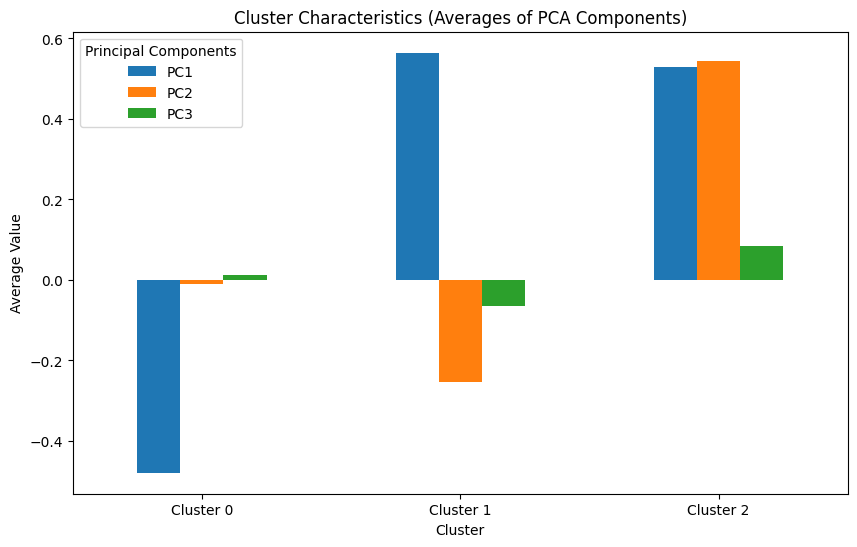

In [186]:
# Simulating the Cluster Characteristics data
cluster_characteristics = pd.DataFrame({
    'PC1': [-0.478775, 0.564404, 0.527984],
    'PC2': [-0.010630, -0.253138, 0.543258],
    'PC3': [0.013305, -0.064585, 0.083166]
}, index=['Cluster 0', 'Cluster 1', 'Cluster 2'])

# Plotting the cluster characteristics
cluster_characteristics.plot(kind='bar', figsize=(10, 6))
plt.title('Cluster Characteristics (Averages of PCA Components)')
plt.xlabel('Cluster')
plt.ylabel('Average Value')
plt.xticks(rotation=0)
plt.legend(title='Principal Components')
plt.show()

Here we see Cluster 0 is highly impacted  by the feaatures in PC1, indicting that these features have an opposite effect so it may lack these features or have them in opposite ways.. Cluster 1 is highly impacted by the features PC1 and CLuster 2 is highly impacted by features both PCA 1 & 2.

Cluster 0 - A large opposite effect with PCA1 features, mainly purchase frequency, purchase installments frequency, follwed by ONEOFF_PURCHASES_FREQUENCY and PRC_FULL_PAYMENT, suggesting these customers in this cluster have low spending, low income, low-engagement customers.
Label = Simple Spenders Low value

Cluster 1 - has the same affecting fetures, but in a positive way. These cluster customers are high-spend, wealthier, and are more engaged, not as new to the company since tenure plays a small roll here as well. They also likely carry balances on their account.
Label = Super Spenders High value

Clusters 2 - is also impacted in the same ways as clust 1, however an slighlty more significant impct also comes from PCA2. This suggest that these customers are high-spend, wealthier, but they also have higher credit limits, with the company for a while, and highly engaged, but do not carry much of a balance. They also have more one off purchases.
Label = Savy Spenders Moderate Value

Silhouette Score: 0.50


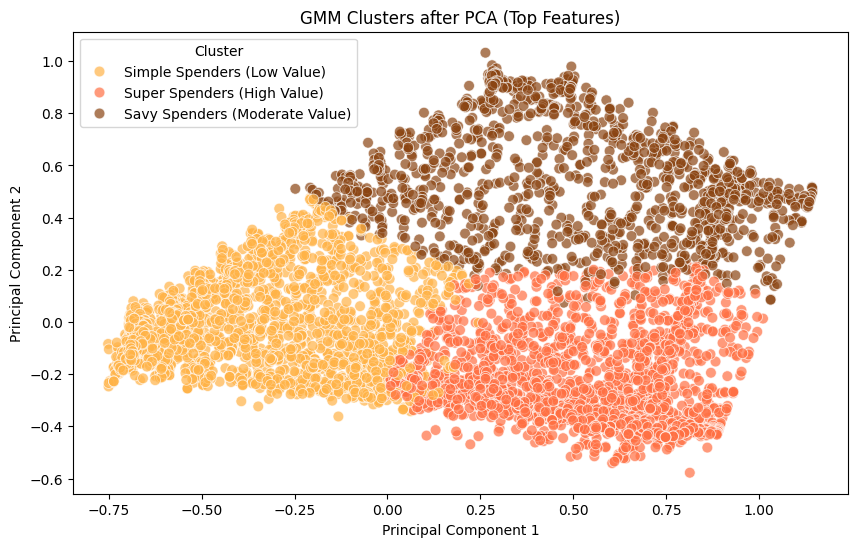

In [198]:
# Name the clusters labers and run a GMM model after dropping immterial features from each PCA column.

# Select the top 6 related features for each principal component
top_features = []
for pc in ['PC1', 'PC2', 'PC3']:
    top_features += loadings_df[pc].abs().sort_values(ascending=False).head(6).index.tolist()

# Keep only the unique features from the top 6 related to each PC column
top_features = list(set(top_features))

# Create a new DataFrame with only the selected features
filtered_df = scaled_df[top_features]

# Apply PCA again on the filtered data
pca_filtered = PCA(n_components=3)
pca_filtered_df = pd.DataFrame(pca_filtered.fit_transform(filtered_df), columns=['PC1', 'PC2', 'PC3'])

# Fit GMM on the PCA-transformed data
gmm = GaussianMixture(n_components=3, covariance_type='tied', random_state=42)
labels = gmm.fit_predict(pca_filtered_df)

# Add cluster labels to the DataFrame
pca_filtered_df['Cluster'] = labels

# Calculate silhouette score
sil_score = silhouette_score(pca_filtered_df[['PC1', 'PC2', 'PC3']], labels)
print(f'Silhouette Score: {sil_score:.2f}')

# Plot the clusters
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(data=pca_filtered_df, x='PC1', y='PC2', hue='Cluster', palette=fall_colors, s=60, alpha=0.7)
plt.title('GMM Clusters after PCA (Top Features)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
scatter.legend_.set_title("Cluster")
new_labels = ['Simple Spenders (Low Value)', 'Super Spenders (High Value)', 'Savy Spenders (Moderate Value)']
for t, l in zip(scatter.legend_.texts[:], new_labels):
    t.set_text(l)
plt.show()


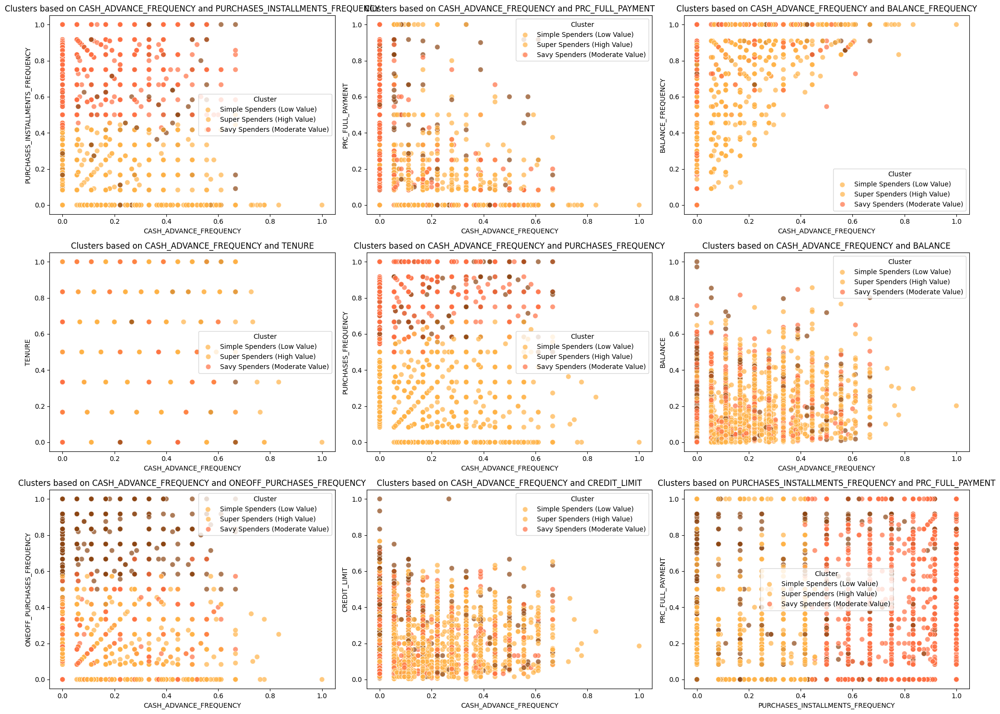

In [204]:
# Create pairwise scatter plots for different combinations of the top features
plt.figure(figsize=(20, 15))
feature_combinations = [(top_features[i], top_features[j]) for i in range(len(top_features)) for j in range(i + 1, len(top_features))]

for idx, (feat_x, feat_y) in enumerate(feature_combinations[:9]):  # Display first 9 combinations
    plt.subplot(3, 3, idx + 1)
    sns.scatterplot(data=filtered_df, x=feat_x, y=feat_y, hue=labels, palette=fall_colors, s=60, alpha=0.7)
    plt.title(f'Clusters based on {feat_x} and {feat_y}')
    plt.xlabel(feat_x)
    plt.ylabel(feat_y)
    plt.legend(title='Cluster', labels=['Simple Spenders (Low Value)', 'Super Spenders (High Value)', 'Savy Spenders (Moderate Value)'])

plt.tight_layout()
plt.show()

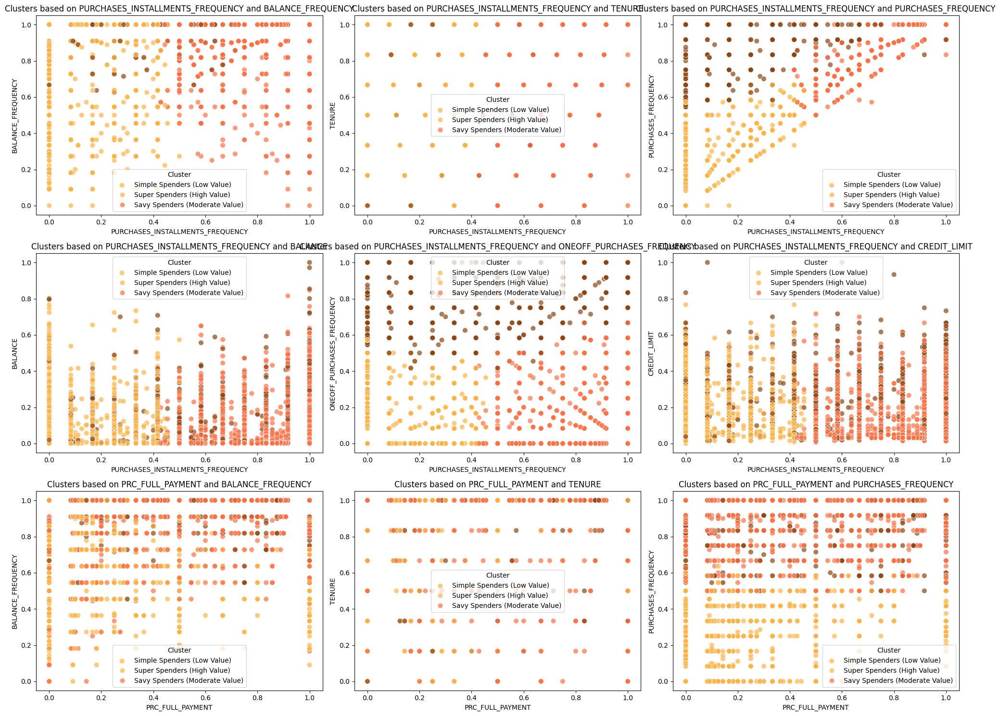

In [206]:
# Create pairwise scatter plots for different combinations of the top features
plt.figure(figsize=(20, 15))
feature_combinations = [(top_features[i], top_features[j]) for i in range(len(top_features)) for j in range(i + 1, len(top_features))]

for idx, (feat_x, feat_y) in enumerate(feature_combinations[9:18]):  # Display next 9 combinations
    plt.subplot(3, 3, idx + 1)
    sns.scatterplot(data=filtered_df, x=feat_x, y=feat_y, hue=labels, palette=fall_colors, s=60, alpha=0.7)
    plt.title(f'Clusters based on {feat_x} and {feat_y}')
    plt.xlabel(feat_x)
    plt.ylabel(feat_y)
    plt.legend(title='Cluster', labels=['Simple Spenders (Low Value)', 'Super Spenders (High Value)', 'Savy Spenders (Moderate Value)'])

plt.tight_layout()
plt.show()

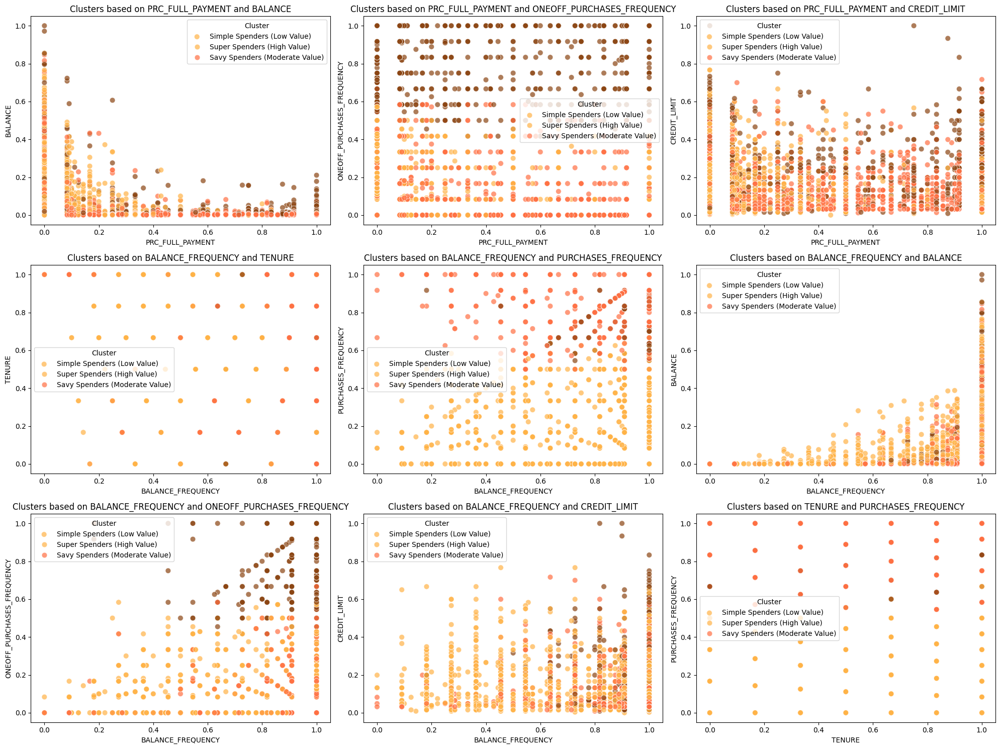

In [208]:
# Create pairwise scatter plots for different combinations of the top features
plt.figure(figsize=(20, 15))
feature_combinations = [(top_features[i], top_features[j]) for i in range(len(top_features)) for j in range(i + 1, len(top_features))]

for idx, (feat_x, feat_y) in enumerate(feature_combinations[18:27]):  # Display next 9 combinations
    plt.subplot(3, 3, idx + 1)
    sns.scatterplot(data=filtered_df, x=feat_x, y=feat_y, hue=labels, palette=fall_colors, s=60, alpha=0.7)
    plt.title(f'Clusters based on {feat_x} and {feat_y}')
    plt.xlabel(feat_x)
    plt.ylabel(feat_y)
    plt.legend(title='Cluster', labels=['Simple Spenders (Low Value)', 'Super Spenders (High Value)', 'Savy Spenders (Moderate Value)'])

plt.tight_layout()
plt.show()

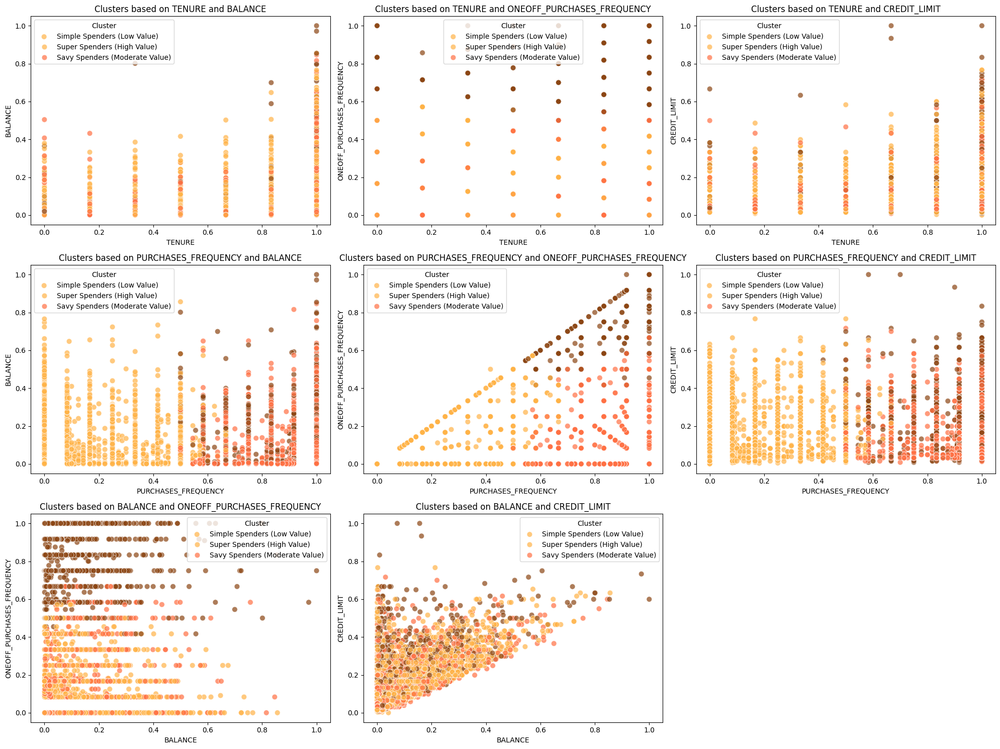

In [209]:
# Create pairwise scatter plots for different combinations of the top features
plt.figure(figsize=(20, 15))
feature_combinations = [(top_features[i], top_features[j]) for i in range(len(top_features)) for j in range(i + 1, len(top_features))]

for idx, (feat_x, feat_y) in enumerate(feature_combinations[27:35]):  # Display next 9 combinations
    plt.subplot(3, 3, idx + 1)
    sns.scatterplot(data=filtered_df, x=feat_x, y=feat_y, hue=labels, palette=fall_colors, s=60, alpha=0.7)
    plt.title(f'Clusters based on {feat_x} and {feat_y}')
    plt.xlabel(feat_x)
    plt.ylabel(feat_y)
    plt.legend(title='Cluster', labels=['Simple Spenders (Low Value)', 'Super Spenders (High Value)', 'Savy Spenders (Moderate Value)'])

plt.tight_layout()
plt.show()

Business Insights